# MDMRT scan project data analysis

## Set up functions to run drift diffusion model fits and plot data with fits

In [1]:
# load all necessary packages
%load_ext rpy2.ipython
%R library(afex)
%R library(sjPlot)
%R library(ggplot2)

#%load_ext pymatbridge
from __future__ import division
from __future__ import print_function
from scipy.stats import norm
from scipy.signal import fftconvolve
import matplotlib.gridspec as gridspec
import brewer2mpl as b2mpl
import fminbnd
import os, glob, scipy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import statsmodels.formula.api as smf
import nilearn
from nilearn import image
from nilearn import plotting
import multiprocessing  
from joblib import Parallel, delayed
import pickle
import statsmodels

# list of subject IDs
subjid=list(range(2,26))+list(range(27,32))+[33]

datapath='../Output/'
eps = 2 ** -52

# a few global variables that speed up optimization
T = None
It = None
STIM_STRENGTH = None
Ic = None

%config InlineBackend.figure_format = 'retina'

sns.set_style('ticks')
sns.set(context='paper', style='darkgrid',font_scale=1.5)


/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: Loading required package: lme4

  warnings.warn(x, RRuntimeWarning)
/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: Loading required package: Matrix

  warnings.warn(x, RRuntimeWarning)
/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: Loading required package: emmeans

  warnings.warn(x, RRuntimeWarning)
/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: NOTE: As of emmeans versions > 1.2.3,
      The 'cld' function will be deprecated in favor of 'CLD'.
      You may use 'cld' only if you have package:multcomp attached.

  warnings.warn(x, RRuntimeWarning)
/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/rinterface/__init__.py:146: RRuntimeWarning: ************
Welcome to afex. For support visit: http://afex.singmann.science/



In [2]:
def fitData(
        data, dt=.0005, k=5, B0=1.5, Bdel=1, B2=1,
        tnd=0.5, tnd_sd=0.05, stim_strength_bias=0, y0=0, plaw=1):

    """
    Fit choices and reaction times to a diffusion to bound model
    with exponentially and symmetrically decreasing bounds

    Parameters
    ----------
    data : 2D array of shape (N, 3) where N is number of trials
          and the columns correspond to stim_strength, rt, and choice

    dt : temporal resolution of the simulated diffusion process

    ########## The following are initial values of parameters ##############

    k : float, proportionality constant between stim_strength and drift rate

    B0 : float, initial bound height

    Bdelay : float, delay in seconds before bound starts decreasing

    B2 : float, coefficient of exponential term that governs bound decrease

    tnd: float, non decision time

    tnd_sd: float, standard deviation of non-decision time

    stim_strength_bias : bias in drift rate (added to stim_strength before k mult)

    y0 : initial offset of decision variable (relative to 0)
    
    plaw : power law coefficient for stim_strengths


    Returns
    -------
    theta : 1D array of 9 params -
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    """

    global T, It, STIM_STRENGTH, Ic
    T, It, STIM_STRENGTH, Ic = None, None, None, None

    stim_strengths = data[:, 0]
    rt = data[:, 1]
    ci = data[:, 2]

    # plausible bounds for the parameters
    theta_lo = [ 0,  0,   0, 0, 0.3, 0.001, -1, 0, 1/20]
    theta_hi = [35, 50, 3.5, 3,   2,   0.2,  1.4, 0, 1.499]
    
    theta_init = [k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw]

    theta, fopt = fminbnd.fminbnd(
        calculateNegLL, theta_init, args=(stim_strengths, rt, ci, dt),
        LB=theta_lo, UB=theta_hi)

    # clear the globals
    T, It, STIM_STRENGTH, Ic = None, None, None, None

    #return theta
    return theta, fopt

In [3]:
# Originally written by Luke Woloszyn in December 2015 (https://github.com/lwoloszy/behavior)
# Modified by Akram Bakkour in September 2017

def plotDotsDataWithFit(data1, theta1, dt=.0005):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 4) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    theta : 9 element list or array containing the fitted DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    dt : float, temporal resolution, in seconds, to use when propagating
         the stimulus strengths to visualize (for plotting only)

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors

    #fig = plt.figure(figsize=(10,20))
    fig, ((ax_choice, ax_rt)) = plt.subplots(2, 1, sharex=True, sharey=False, figsize=(8,14))
    
    k1, B01, Bdel1, B21, tnd1, tnd_sd1, stim_strength_bias1, y01, plaw1 = theta1
    stim_strengths1, rt1, ci1, subj1 = data1[:, 0], data1[:, 1], data1[:, 2], data1[:, 3]

    stim_strengths1 = stim_strengths1.astype("complex") ** plaw1

    ustim_strengths1 = np.unique(stim_strengths1) 

    stim_strengths_to_propagate1 = np.linspace(
        np.min(ustim_strengths1), np.max(ustim_strengths1), 51)

    drifts1, t1, Bup1, Blo1, y1, yinit1 = discretize(
        theta1, stim_strengths_to_propagate1, np.max(rt1), dt)

    D1 = propagate(drifts1, t1, Bup1, Blo1, y1, yinit1)

    meanprop1 = sortedFunc(ci1, stim_strengths1, 'mean')[:, 1]

    df1=pd.DataFrame(data1,columns=['stim_strength','rt','ci','subj'])  
    df1['ci']=df1['ci'].astype('bool')
    df1['rt']=df1['rt'].astype('float64')
    df1['stim_strength']=stim_strengths1
    
    
    # calculate participant means per subject
    smean1 = df1.groupby(['subj','stim_strength'],as_index=False).mean()

    # SEM across participant means
    semprop1 = smean1.groupby('stim_strength').sem()['ci']

    if len(df1['subj'].unique())==1:
        semprop1 = df1.groupby('stim_strength').sem()['ci']
    

    
    # predicted proportions
    predprop1 = D1['up']['p'][:]
    

    #means per participant per stim_strenght
    bothmeans1=df1.groupby(['subj','stim_strength'],as_index=False).mean()
    
    del bothmeans1['ci'] 
    
    
    meanrt_both1=df1.groupby(['stim_strength']).mean()['rt']
    
    
    semrt_both1=bothmeans1.groupby('stim_strength').sem()['rt']
    
    if len(df1['subj'].unique())==1:
        semrt_both1=df1.groupby('stim_strength').sem()['rt']
    
        
    
    predrt_both1 = D1['both']['mean_t'][0] + tnd1


    #ax_choice = fig.add_subplot(2, 1, 1)
    ax_choice.errorbar(ustim_strengths1, meanprop1, yerr=semprop1, color='k',
                       linestyle='None', capsize=0, marker='o',alpha=.5)
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate1, predprop1, color='k'))


    xdata = stim_strengths_to_propagate1
    ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    #ax_choice.set_xlabel('Color Coherence (yellow-to-blue)')
    ax_choice.set_ylabel('P(respond blue)')
    #ax_choice.set_title('Perceptual decisions')
        
    #ax_rt = fig.add_subplot(2, 1, 2, sharex=ax_choice)
    ustim_strengths1=np.array(meanrt_both1.index)

    ax_rt.errorbar(ustim_strengths1, meanrt_both1, yerr=semrt_both1,
                   color='k', linestyle='None', marker='o', capsize=0,alpha=.5)
    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate1, predrt_both1,
        color='k', marker='None'))

    ax_rt.set_xlabel('Color coherence (log(blue/yellow))')
    ax_rt.set_ylabel('Reaction time (s)')

    ax_rt.set_xlim((-2 * 1.2, 2 * 1.2))
    ax_rt.set_ylim(.7,1.5)

    sns.despine(offset=0, trim=False)
    
    plt.tight_layout()
    plt.savefig('plots/perceptual_group.pdf', dpi=300,format='pdf')
    plt.show()
    

In [4]:
# Originally written by Luke Woloszyn in December 2015 (https://github.com/lwoloszy/behavior)
# Modified by Akram Bakkour in September 2017

def plotDotsDataWithFitSub(data1, theta1, plotcolor='k', subnum='X00', dt=.0005):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 4) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    theta : 9 element list or array containing the fitted DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    dt : float, temporal resolution, in seconds, to use when propagating
         the stimulus strengths to visualize (for plotting only)

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors

    #fig = plt.figure(figsize=(10,20))
    fig, ((ax_choice, ax_rt)) = plt.subplots(2, 1, sharex=True, sharey=False, figsize=(8,14))
    
    k1, B01, Bdel1, B21, tnd1, tnd_sd1, stim_strength_bias1, y01, plaw1 = theta1
    stim_strengths1, rt1, ci1, subj1 = data1[:, 0], data1[:, 1], data1[:, 2], data1[:, 3]

    stim_strengths1 = stim_strengths1.astype("complex") ** plaw1
    ustim_strengths1 = np.unique(stim_strengths1) 
    stim_strengths_to_propagate1 = np.linspace(
        np.min(ustim_strengths1), np.max(ustim_strengths1), 51)

    drifts1, t1, Bup1, Blo1, y1, yinit1 = discretize(
        theta1, stim_strengths_to_propagate1, np.max(rt1), dt)

    D1 = propagate(drifts1, t1, Bup1, Blo1, y1, yinit1)

    meanprop1 = sortedFunc(ci1, stim_strengths1, 'mean')[:, 1]
    df1=pd.DataFrame(data1,columns=['stim_strength','rt','ci','subj'])  
    df1['ci']=df1['ci'].astype('bool')
    df1['rt']=df1['rt'].astype('float64')
    df1['stim_strength']=stim_strengths1
    
    
    # calculate participant means per subject
    smean1 = df1.groupby('stim_strength',as_index=False).mean()
    # SEM across participant means
    semprop1 = smean1.groupby('stim_strength').sem()['ci']
    
    if len(df1['subj'].unique())==1:
        semprop1 = df1.groupby('stim_strength').sem()['ci']
    
    
    # predicted proportions
    predprop1 = D1['up']['p'][:]
    
    #means per participant per stim_strenght
    bothmeans1=df1.groupby(['subj','stim_strength'],as_index=False).mean()
    
    del bothmeans1['ci'] 
        
    meanrt_both1=df1.groupby(['stim_strength']).mean()['rt']
    
    
    semrt_both1=bothmeans1.groupby('stim_strength').sem()['rt']
    
    if len(df1['subj'].unique())==1:
        semrt_both1=df1.groupby('stim_strength').sem()['rt']
    
        
    

    predrt_both1 = D1['both']['mean_t'][0] + tnd1
    

    #ax_choice = fig.add_subplot(2, 1, 1)
    ax_choice.errorbar(ustim_strengths1, meanprop1, yerr=semprop1, color=plotcolor,
                       linestyle='None', capsize=0, marker='o',alpha=.5)
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate1, predprop1, color=plotcolor))

    xdata = stim_strengths_to_propagate1
    ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    #ax_choice.set_xlabel('Color Coherence (yellow-to-blue)')
    ax_choice.set_ylabel('P(respond blue)',fontsize='large')
    ax_choice.set_title('Perceptual decisions for \n participant '+subnum,fontsize='x-large')
    
    ax_choice.text(1,.3,'N = '+str(len(ci1)),fontsize='large')
    
    #ax_rt = fig.add_subplot(2, 1, 2, sharex=ax_choice)
    ustim_strengths1=np.array(meanrt_both1.index)

    ax_rt.errorbar(ustim_strengths1, meanrt_both1, yerr=semrt_both1,
                   color=plotcolor, linestyle='None', marker='o', capsize=0,alpha=.5)
    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate1, predrt_both1,
        color=plotcolor, marker='None'))

    ax_rt.set_xlabel('Color coherence (log(blue/yellow))',fontsize='large')
    ax_rt.set_ylabel('Reaction time (s)',fontsize='large')

    ax_rt.set_xlim((-2 * 1.2, 2 * 1.2))
    #ax_rt.set_ylim(df1.rt.min()-semrt_both1.max(),df1.rt.max()-semrt_both1.max())

    sns.despine(offset=0, trim=False)
    
    plt.tight_layout()
    plt.savefig('plots/perceptual/sub'+subnum+'.pdf', dpi=300,format='pdf')
    plt.show()
    
    

In [5]:
# Originally written by Luke Woloszyn in December 2015 (https://github.com/lwoloszy/behavior)
# Modified by Akram Bakkour in September 2017

def plotFoodDataWithFit(data1, theta1, dt=.0005):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 4) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    theta : 9 element list or array containing the fitted DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    dt : float, temporal resolution, in seconds, to use when propagating
         the stimulus strengths to visualize (for plotting only)

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors

    #fig = plt.figure(figsize=(10,20))
    fig, ((ax_choice, ax_rt)) = plt.subplots(2, 1, sharex=True, sharey=False, figsize=(8,14))
    
    k1, B01, Bdel1, B21, tnd1, tnd_sd1, stim_strength_bias1, y01, plaw1 = theta1
    stim_strengths1, rt1, ci1, subj1 = data1[:, 0], data1[:, 1], data1[:, 2], data1[:, 3]

    stim_strengths1 = stim_strengths1.astype("complex") ** plaw1
    ustim_strengths1 = np.unique(stim_strengths1) 
    stim_strengths_to_propagate1 = np.linspace(
        np.min(ustim_strengths1), np.max(ustim_strengths1), 51)

    drifts1, t1, Bup1, Blo1, y1, yinit1 = discretize(
        theta1, stim_strengths_to_propagate1, np.max(rt1), dt)

    D1 = propagate(drifts1, t1, Bup1, Blo1, y1, yinit1)

    meanprop1 = sortedFunc(ci1, stim_strengths1, 'mean')[:, 1]
    df1=pd.DataFrame(data1,columns=['stim_strength','rt','ci','subj'])  
    df1['ci']=df1['ci'].astype('bool')
    df1['rt']=df1['rt'].astype('float64')
    df1['stim_strength']=stim_strengths1
   
    
    # calculate participant means per subject
    smean1 = df1.groupby(['subj','stim_strength'],as_index=False).mean()
    # SEM across participant means
    semprop1 = smean1.groupby('stim_strength').sem()['ci']
    if len(df1['subj'].unique())==1:
        semprop1 = df1.groupby('stim_strength').sem()['ci']

    
    # predicted proportions
    predprop1 = D1['up']['p'][:]

    #means per participant per stim_strenght
    bothmeans1=df1.groupby(['subj','stim_strength'],as_index=False).mean()
    del bothmeans1['ci'] 
    
    meanrt_both1=df1.groupby(['stim_strength']).mean()['rt']
    
    semrt_both1=bothmeans1.groupby('stim_strength').sem()['rt']
    if len(df1['subj'].unique())==1:
        semrt_both1=df1.groupby('stim_strength').sem()['rt']
    

    predrt_both1 = D1['both']['mean_t'][0] + tnd1

    #ax_choice = fig.add_subplot(2, 1, 1)
    ax_choice.errorbar(ustim_strengths1, meanprop1, yerr=semprop1, color='k',
                       linestyle='None', capsize=0, marker='o',alpha=.5)
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate1, predprop1, color='k'))

    xdata = stim_strengths_to_propagate1
    ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    #ax_choice.set_xlabel('Color Coherence (yellow-to-blue)')
    ax_choice.set_ylabel('P(respond right)')
    #ax_choice.set_title('Perceptual decisions')
        
    #ax_rt = fig.add_subplot(2, 1, 2, sharex=ax_choice)
    ustim_strengths1=np.array(meanrt_both1.index)
    ax_rt.errorbar(ustim_strengths1, meanrt_both1, yerr=semrt_both1,
                   color='k', linestyle='None', marker='o', capsize=0,alpha=.5)
    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate1, predrt_both1,
        color='k', marker='None'))

   
    ax_rt.set_xlabel(r'$\Delta$'+'Value (right - left)')
    ax_rt.set_ylabel('Reaction time (s)')

    ax_rt.set_xlim((-2 * 1.2, 2 * 1.2))
    ax_rt.set_ylim(.7,1.5)

    sns.despine(offset=0, trim=False)
    
    plt.tight_layout()
    plt.savefig('plots/valuebin_group.pdf', dpi=300,format='pdf')
    plt.show()
    

In [6]:
# Originally written by Luke Woloszyn in December 2015 (https://github.com/lwoloszy/behavior)
# Modified by Akram Bakkour in September 2017

def plotFoodDataWithFitSub(data1, theta1, plotcolor='k', subnum='X00' ,dt=.0005):
    """
    Given a  diffusion to bound model with exponentially collapsing bounds
    parametrized by theta, plot raw behavioral data and its dtb fit

    Parameters
    ----------
    data : 2D array of shape (N, 3) where N is total number of trials
           and the columns correspond to stim_strength, rt, and choice, subjid

    theta : 9 element list or array containing the fitted DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    dt : float, temporal resolution, in seconds, to use when propagating
         the stimulus strengths to visualize (for plotting only)

    Returns
    -------

    """

    colors = b2mpl.get_map('Set1', 'Qualitative', 3).mpl_colors

    #fig = plt.figure(figsize=(10,20))
    fig, ((ax_choice, ax_rt)) = plt.subplots(2, 1, sharex=True, sharey=False, figsize=(8,14))
    k1, B01, Bdel1, B21, tnd1, tnd_sd1, stim_strength_bias1, y01, plaw1 = theta1
    stim_strengths1, rt1, ci1 = data1[:, 0], data1[:, 1], data1[:, 2]
 
    bins1=10

    stim_strengths1 = stim_strengths1.astype("complex") ** plaw1
    ustim_strengths1 = np.unique(stim_strengths1)
    stim_strengths_to_propagate1 = np.linspace(
        np.min(ustim_strengths1), np.max(ustim_strengths1), 51)
    
    drifts1, t1, Bup1, Blo1, y1, yinit1 = discretize(
        theta1, stim_strengths_to_propagate1, np.max(rt1), dt)

    D1 = propagate(drifts1, t1, Bup1, Blo1, y1, yinit1)

    df1=pd.DataFrame(data1,columns=['stim_strength','rt','ci','subj','deltaval'])  
    df1['ci']=df1['ci'].astype('bool')
    df1['rt']=df1['rt'].astype('float64')


    dfsorted1=df1.sort_values('deltaval', ascending=True)
    
    #running mean of choices
    meanprop1 = pd.Series.rolling(dfsorted1['ci'],bins1,min_periods=np.int(bins1/2),center=True).mean()
    
    # predicted proportions
    predprop1 = D1['up']['p'][:]

    #chose right or chose left
    cr1=dfsorted1[dfsorted1['ci']==1]
    cl1=dfsorted1[dfsorted1['ci']==0]


    #running mean of rt
    meanrt_lo1 = pd.Series.rolling(cl1['rt'],50,min_periods=50).mean()
    meanrt_up1 = pd.Series.rolling(cr1['rt'],50,min_periods=50).mean()
    meanrt_both1 = pd.Series.rolling(dfsorted1['rt'],bins1,min_periods=np.int(bins1),center=True).mean()

    predrt_up1 = D1['up']['mean_t'][0] + tnd1
    predrt_lo1 = D1['lo']['mean_t'][0] + tnd1
    predrt_both1 = D1['both']['mean_t'][0] + tnd1

    #ax_choice = fig.add_subplot(2, 1, 1)
    ax_choice.add_line(
        plt.Line2D(dfsorted1['deltaval'], meanprop1, color=plotcolor,alpha=0.5))
    ax_choice.add_line(
        plt.Line2D(stim_strengths_to_propagate1, predprop1, color=plotcolor))

    xdata = stim_strengths_to_propagate1
    ax_choice.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_choice.set_ylim((-0.01, 1.01))
    #ax_choice.set_xlabel('DeltaValue (Right - Left)')
    ax_choice.set_ylabel('P(respond right)',fontsize='large')
    ax_choice.set_title('Value-based decisions for \n participant '+subnum,fontsize='x-large')
    
    ax_choice.text(1,.3,'N = '+str(len(ci1)),fontsize='large')
    
    #ax_rt = fig.add_subplot(2, 1, 2, sharex=ax_choice)
    ax_rt.add_line(
        plt.Line2D(dfsorted1['deltaval'], meanrt_both1, color=plotcolor,alpha=0.5))
    ax_rt.add_line(plt.Line2D(
        stim_strengths_to_propagate1, predrt_both1,
        color=plotcolor, marker='None'))

    ax_rt.set_xlabel(r'$\Delta$'+'Value (right - left)',fontsize='large')
    ax_rt.set_ylabel('Reaction time (s)',fontsize='large')

    #ax_rt.set_xlim((np.min(xdata) * 1.2, np.max(xdata) * 1.2))
    ax_rt.set_xlim((-2 * 1.2, 2 * 1.2))
    ax_rt.set_ylim(np.nanmin(meanrt_both1), np.nanmax(meanrt_both1))
    #ax_rt.set_ylim(.8,1.9)

    sns.despine(offset=0, trim=False)
    
    plt.tight_layout()
    plt.savefig('plots/value_based/sub'+subnum+'.pdf', dpi=300,format='pdf')
    plt.show()
    

In [7]:
# Originally written by Luke Woloszyn in December 2015 (https://github.com/lwoloszy/behavior)
# Modified by Akram Bakkour in September 2017

def calculateNegLL(theta, stim_strengths, rt, ci, dt=0.0005):
    """
    Given a  diffusion to bound model with quadratically collapsing bounds
    parametrized by theta, compute the negative log likelihood of the data

    Parameters
    ----------
    theta : 8 element list or array containing the DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0

    stim_strengths : array of stimulus strengths, length equal to # trials

    rt : array of reaction times, length equal to # trials

    ci : array of choices (0, 1: 1 is correct choice for positive
         stim_strengths), length equal to # trials

    dt : float, temporal resolution, in seconds, to use when propagating

    Returns
    -------
    neglogll : float, negative log likelihood of the data

    """

    global T, It, STIM_STRENGTH, Ic

    # unpack parameters
    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta
    
    stim_strengths = stim_strengths.astype("complex") ** plaw
    u_stim_strengths = np.unique(stim_strengths)

    # propagate expects drift to be 2d so that it can tile properly
    drifts, t, Bup, Blo, y, yinit = discretize(
        theta, u_stim_strengths, np.max(rt), dt)

    # propagate density
    D = propagate(drifts, t, Bup, Blo, y, yinit)

    # convolve distribution of exit times with Gaussian distribution of tnd
    r = norm.pdf(t, tnd, tnd_sd) * dt
    P_UP = np.zeros([D['up']['pdf_t'].shape[0] + r.shape[0] - 1,
                     D['up']['pdf_t'].shape[1]])
    P_LO = np.zeros([D['lo']['pdf_t'].shape[0] + r.shape[0] - 1,
                     D['up']['pdf_t'].shape[1]])
    P_BOTH = np.zeros([D['both']['pdf_t'].shape[0] + r.shape[0] - 1,
                     D['both']['pdf_t'].shape[1]])
    for i in range(len(u_stim_strengths)):
        P_UP[:, i] = fftconvolve(D['up']['pdf_t'][:, i], r.flatten())
        P_LO[:, i] = fftconvolve(D['lo']['pdf_t'][:, i], r.flatten())
        P_BOTH[:, i] = fftconvolve(D['both']['pdf_t'][:, i], r.flatten())

    if T is None:
        # find time index of each trial
        T = np.tile(t, [1, len(rt)])
        It = np.sum(~(T >= rt), axis=0) - 1

        # find stim_strength index of each trial
        C = np.tile(np.atleast_2d(u_stim_strengths), [len(stim_strengths), 1])
        Ic = np.sum(C <= np.atleast_2d(stim_strengths).T, axis=1) - 1

    p_up = P_UP[It, Ic]
    p_lo = P_LO[It, Ic]
    p_both = P_BOTH[It, Ic]
    p_up = np.clip(p_up, eps, 1 - eps)
    p_lo = np.clip(p_lo, eps, 1 - eps)
    p_both = np.clip(p_both, eps, 1 - eps)

    ppred = p_up * ci + p_lo * np.logical_not(ci)
    #ppred = p_both
    neglogl = -np.sum(np.log(ppred))

    return neglogl

In [8]:
# Originally written by Luke Woloszyn in December 2015 (https://github.com/lwoloszy/behavior)
# Modified by Akram Bakkour in September 2017

def propagate(drifts, t, Bup, Blo, y, y0, notabs_flag=False):
    """
    Given a set of drift rates and bounds, compute various quantities
    that characterize the behavior of the drift-diffusion process

    Parameters
    ----------
    drifts : 2D array of shape (1, nd) where nd is the number of drift rates;
             this is a row vector of drifts

    t : 2D array of shape (nt, 1) where nt is the number of time points;
        this is a column vector of time points

    Bup : 2D array of shape (nt, 1) where nt is the number of time points;
          this is a column vector of upper bounds, one value per each time bin

    Blo : 2D array of shape (nt, 1) where nt is the number of time points;
          this is a column vector of lower bounds, one value per each time bin

    y : 2D array of shape (ng, 1) where ng is the number of grid points
        over which to compute Gaussian density; this is a column vector
        of grid points to which y0 corresponds

    y0 : 2D array of shape (ng, 1) where ng is the number of grid points
         over which to compute Gaussian density; this is a column vector
         of actual initial density values

    notabs_flag : boolean, whether to store the not absorbed portion of density

    Returns
    -------
    D : dictionary, contains for each unique stimulus strengh the probability
        of hitting the upper or lower bound, the mean reaction times for the
        two bounds, and the cumulative distribution of reaction times for the
        two bounds (and the not absored densities if requested)

    """
    
    nd = drifts.shape[1]
    nt = t.shape[0]
    dt = t[1, 0] - t[0, 0]
    ny = y.shape[0]

    D = {}
    D['bounds'] = np.column_stack([Bup, Blo])
    D['drifts'] = drifts

    # create fft of zero mean, unit variance gaussian
    kk = np.tile(np.atleast_2d(np.concatenate(
        [np.arange(0, ny / 2 + 1), np.arange(-ny / 2 + 1, 0)])).T, [1, nd])
    omega = 2 * np.pi * kk / (np.max(y) - np.min(y))
    E1 = np.exp(-0.5 * dt * np.power(omega, 2))
    D['up'] = {}
    D['lo'] = {}
    D['both'] = {}
    if notabs_flag:
        D['notabs'] = {}

    D['up']['pdf_t'] = np.zeros([nt, nd])
    D['lo']['pdf_t'] = np.zeros([nt, nd])
    D['both']['pdf_t'] = np.zeros([nt, nd])
    if notabs_flag:
        D['notabs']['pdf'] = np.zeros([nd, ny, nt])

    # U is initial state, one column for each drift rate
    U = np.tile(y0, [1, nd])

    # shift mean of zero mean, unit variance gaussian by drift
    E2 = E1 * np.exp(-1j * omega * np.tile(drifts, [ny, 1]) * dt)

    # prepare the values to propagate for vectorization
    y = np.tile(y, [1, nd])
    p_threshold = .00001
    for i in range(nt):
        # fft current pdf
        Ufft = np.fft.fft(U, axis=0)

        # convolve with gaussian with drift in the frequency domain
        Ufft = E2 * Ufft

        # turn back into time domain
        U = np.real(np.fft.ifft(Ufft, axis=0))
        U = np.clip(U, 0, np.inf)

        D['up']['pdf_t'][i, :] = np.sum(U * (y >= Bup[i]), axis=0)
        D['lo']['pdf_t'][i, :] = np.sum(U * (y <= Blo[i]), axis=0)
        D['both']['pdf_t'][i, :] = np.sum(U * ((y <= Blo[i]) | (y >= Bup[i])), axis=0)

        # keep only density within bounds
        U *= np.logical_and(y > Blo[i], y < Bup[i])

        # store not absorbed density if requested
        if notabs_flag:
            D['notabs']['pdf'][:, :, i] = U.T

        if np.sum(np.sum(U, axis=0) < p_threshold) == nd:
            break

    D['t'] = t

    D['up']['p'] = np.sum(D['up']['pdf_t'], axis=0)
    D['lo']['p'] = np.sum(D['lo']['pdf_t'], axis=0)
    D['both']['p'] = np.sum(D['both']['pdf_t'], axis=0)

    D['up']['mean_t'] = np.dot(t.T, D['up']['pdf_t']) / D['up']['p']
    D['lo']['mean_t'] = np.dot(t.T, D['lo']['pdf_t']) / D['lo']['p']
    D['both']['mean_t'] = np.dot(t.T, D['both']['pdf_t']) / D['both']['p']

    D['up']['cdf_t'] = np.cumsum(D['up']['pdf_t'], axis=0)
    D['lo']['cdf_t'] = np.cumsum(D['lo']['pdf_t'], axis=0)
    D['both']['cdf_t'] = np.cumsum(D['both']['pdf_t'], axis=0)

    return D

In [9]:
# Originally written by Luke Woloszyn in December 2015 (https://github.com/lwoloszy/behavior)
# Modified by Akram Bakkour in September 2017

def discretize(theta, stim_strengths, tmax, dt):
    """
    Utility function that sets up the grid on which to do density propagation
    and also computes some additional required quantities

    Parameters
    ----------
    theta : 9 element list or array containing the DTB parameters
            k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw

    stim_strengths : array of unique stimulus strength for which to do
                     propagation

    tmax : float, maximum time for which to propagate

    dt : float, temporal resolution, in seconds, to use when propagating

    Returns
    -------
    drifts : array of shape (nd,) when nd is the number of drifts

    t : array of shape (nt,) where nt is the number of time points;
        vector of time points

    Bup : array of shape (nt,) where nt is the number of time points;
          vector of upper bounds, one value per each time bin

    Blo : array of shape (nt,) where nt is the number of time points;
          vector of lower bounds, one value per each time bin

    y : array of shape (ng,) where ng is the number of grid points
        over which to compute Gaussian density;
        these are the grid points to which y0 corresponds

    yinit : array of shape (ng,) where ng is the number of grid points
            over which to compute Gaussian density;
            these are the  actual initial density values

    """

    k, B0, Bdel, B2, tnd, tnd_sd, stim_strength_bias, y0, plaw = theta

    # time
    tmax = tmax + .3
    t = np.arange(0, tmax, dt)

    # bounds
    Bup = B0 * (t == t)
    s = t > Bdel

    #exponential
    Bup[s] = B0 * np.exp(-B2 * (t[s] - Bdel))
    Blo = -Bup

    # drift rate
    drifts = k * (stim_strengths + stim_strength_bias)
    
    # max unsigned drift
    md = np.max(np.abs(drifts))
    sm = md * dt + np.sqrt(dt) * 4
    y = np.linspace(np.min(Blo) - sm, np.max(Bup) + sm, 512)
    yinit = 0 * y

    i1 = np.where(y >= y0)[0][0]
    i2 = np.where(y <= y0)[0][-1]

    if i1 == i2:
        yinit[i1] = 1
    else:
        w2 = np.abs(y[i1] - y0)
        w1 = np.abs(y[i2] - y0)

        w1 = w1 / (w1 + w2)
        w2 = (1 - w1)
        yinit[i1] = w1
        yinit[i2] = w2

    drifts = drifts[np.newaxis, :]
    t = t.reshape(-1, 1)
    Bup = Bup.reshape(-1, 1)
    Blo = Blo.reshape(-1, 1)
    y = y.reshape(-1, 1)
    yinit = yinit.reshape(-1, 1)

    return drifts, t, Bup, Blo, y, yinit

In [10]:
# Originally written by Luke Woloszyn in December 2015 (https://github.com/lwoloszy/behavior)
# Modified by Akram Bakkour in September 2017

def sortedFunc(x, y, func):
    unique_y = np.sort(np.unique(y))
    ny = len(unique_y)

    out_x = np.empty(ny)
    counts_y = np.empty(ny)
    for i, j in zip(range(ny), unique_y):
        out_x[i] = getattr(np, func)(np.array(x)[np.array(y) == j])
        counts_y[i] = np.sum(np.array(y) == j)

    return(np.column_stack([unique_y, out_x, counts_y]))

# Choice and RT data conform to regularities of bounded drift diffusion models
## Color Dots
### Load in all dots task data

In [11]:
# make list of files
filelist=[]
# use zfill to zero pad subject number, participant IDs are of the form MDMRT_XXX
for s in subjid:
    filelist=filelist+glob.glob(datapath+'MDMRT_'+str(s).zfill(3)+'_dots_task_run_*m.txt')
# load data into dataframe
dots=pd.read_table(filelist[0],sep=" ")
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep=" ")
    dots=pd.concat([dots,tmp])

### Compile dots data for fit

In [12]:
# only take valid trials
isvalidtrial=dots['response']!='x'
dots=dots[isvalidtrial]

# code chose choseblue
isorder1=dots['button_order'] == 1
ispressleft=dots['response'] == '3#'
isorder2=dots['button_order'] == 2
ispressright=dots['response'] == '4$'

choseblue = isorder1 & ispressleft | isorder2 & ispressright

#make new column in dataframe for choseblue
dots=dots.assign(choseblue=choseblue)

### Fit to DOTS data

In [13]:
dots=dots[dots.RT>=.3]
datadots=np.column_stack([dots['color_coh'],dots['RT'],dots['choseblue']])
[thetadots,dotsfopt]=fitData(datadots)
pickle.dump([thetadots,dotsfopt],open('thetadotscombined.p','wb'))

### Plot Dots data combinesd across trials and participants with fits
#### Figure 2A

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


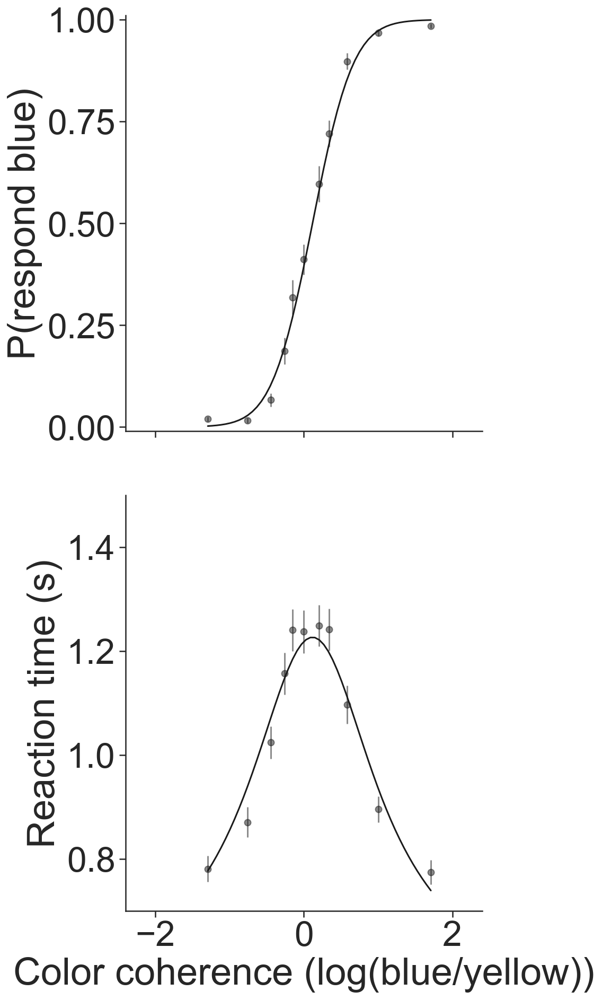

In [14]:
[thetadots,dotsfopt]=pickle.load(open('thetadotscombined.p','rb'),encoding='latin1')
datadotsplot=np.column_stack([dots['color_coh'],dots['RT'],dots['choseblue'],dots['subjid']])
# Plot data with fits
sns.set_context('talk')
sns.set(font_scale=3)
sns.set_style('ticks')
plotDotsDataWithFit(datadotsplot, thetadots, dt=.0005)

### Color Dots choice data logistic regression

/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
  res = PandasDataFrame.from_items(items)


Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: choseblue ~ color_coh + (1 | subjid)
   Data: dots

     AIC      BIC   logLik deviance df.resid 
  4594.8   4615.0  -2294.4   4588.8     6196 

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-101.897   -0.452   -0.012    0.410  156.818 

Random effects:
 Groups Name        Variance Std.Dev.
 subjid (Intercept) 0.6167   0.7853  
Number of obs: 6199, groups:  subjid, 30

Fixed effects:
            Estimate Std. Error z value Pr(>|z|)    
(Intercept)  -0.2897     0.1481  -1.955   0.0505 .  
color_coh     4.2203     0.1311  32.190   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Effects:
          (Intr)
color_coh -0.028
[1] "BOOTSTRAPPED CIs"
                 2.5 %       97.5 %
(Intercept) -0.5799906 0.0006649433
color_coh    3.9633205 4.4772461449


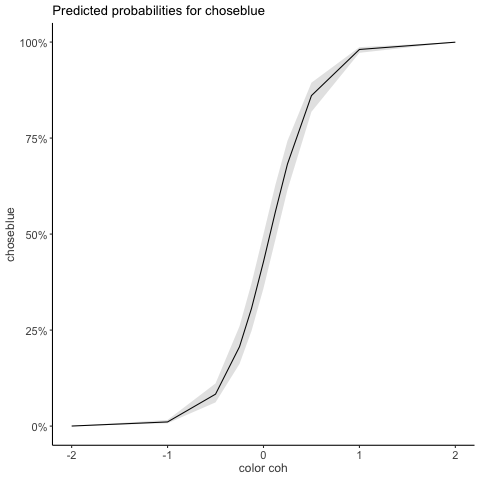

In [15]:
%%R -i dots
## there is no good package to run mixed effects logistic regression, using R's lme4 package
dots$choseblue=as.numeric(dots$choseblue)
dotschoicemod=glmer(choseblue ~ color_coh + (1|subjid), family='binomial', data=dots)

nranpars <- length(getME(dotschoicemod,"theta"))
nfixpars <- length(fixef(dotschoicemod))
confintdotschoicemod=confint(dotschoicemod,method="boot", nsim=1000, parm=(nranpars+1):(nranpars+nfixpars), parallel="multicore", ncpus=8)

save(dotschoicemod,confintdotschoicemod, file = "dotschoicemod.RData")
load("dotschoicemod.RData")

print(summary(dotschoicemod))
print("BOOTSTRAPPED CIs")
print(confintdotschoicemod)

set_theme(theme_classic())
plot_model(dotschoicemod,type='eff',terms='color_coh',show.ci=TRUE)

### Color dots RT data linear regression

In [16]:
# RT mixed effects linear model using python's statsmodels
dots=dots.assign(abscolorcoh=dots['color_coh'].abs())
dotsmd = smf.mixedlm('RT ~ abscolorcoh', dots, groups=dots['subjid'])
dotsmdf = dotsmd.fit()
print(dotsmdf.summary())

         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: RT        
No. Observations: 6199    Method:             REML      
No. Groups:       30      Scale:              0.1024    
Min. group size:  189     Likelihood:         -1796.7351
Max. group size:  210     Converged:          Yes       
Mean group size:  206.6                                 
--------------------------------------------------------
             Coef.  Std.Err.    z    P>|z| [0.025 0.975]
--------------------------------------------------------
Intercept     1.227    0.029  42.986 0.000  1.171  1.283
abscolorcoh  -0.248    0.006 -41.695 0.000 -0.260 -0.237
Group Var     0.023    0.020                            



/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
  res = PandasDataFrame.from_items(items)


Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: RT ~ abscolorcoh + (1 | subjid)
   Data: dots

REML criterion at convergence: 3593.5

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-3.2955 -0.6799 -0.1377  0.5210  5.2816 

Random effects:
 Groups   Name        Variance Std.Dev.
 subjid   (Intercept) 0.02348  0.1532  
 Residual             0.10240  0.3200  
Number of obs: 6199, groups:  subjid, 30

Fixed effects:
              Estimate Std. Error         df t value Pr(>|t|)    
(Intercept)  1.227e+00  2.854e-02  3.011e+01    43.0   <2e-16 ***
abscolorcoh -2.483e-01  5.955e-03  6.170e+03   -41.7   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Effects:
            (Intr)
abscolorcoh -0.136
[1] "BOOSTRAPPED CIs"
                 2.5 %     97.5 %
(Intercept)  1.1710653  1.2829225
abscolorcoh -0.2599646 -0.2366215


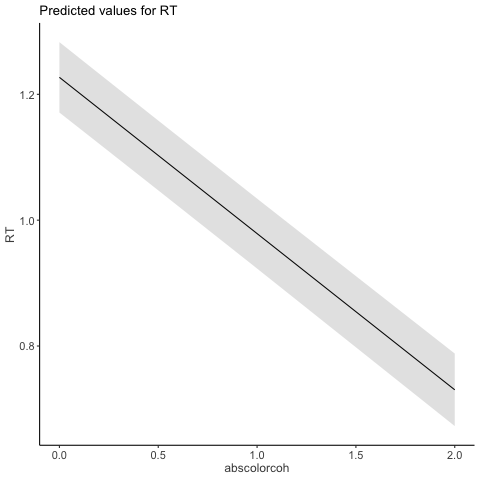

In [17]:
%%R -i dots
## compare the model using python's statsmodels (above) to R's lme4
dotsrtmod=lmer(RT ~ abscolorcoh + (1|subjid), data=dots)

nranpars <- length(getME(dotsrtmod,"theta"))
nfixpars <- length(fixef(dotsrtmod))
confintdotschoicemod=confint(dotschoicemod,method="boot", nsim=1000, parm=(nranpars+2):(nranpars+nfixpars+1), parallel="multicore", ncpus=8)

save(dotsrtmod,confintdotsrtmod, file = "dotsrtmod.RData")
load("dotsrtmod.RData")

print(summary(dotsrtmod))
print("BOOSTRAPPED CIs")
print(confintdotsrtmod)

plot_model(dotsrtmod,type='eff',show.ci=T, show.values=T, terms="abscolorcoh")

### Plot Dots data with fits per participant
#### Figure 2—figure supplement 1

In [18]:
def do_fit_dotssub(i):
    dots=pd.read_csv('dots.csv')
    uni_sub=dots.subjid.unique()
    s=uni_sub[i]
    dotssub=dots[dots['subjid']==s]
    datadots=np.column_stack([dotssub['color_coh'],dotssub['RT'],dotssub['choseblue']])
    [thetadotssub,fopt]=fitData(datadots)
    tmp=thetadotssub.tolist()
    tmp.append(fopt)
    tmp.append(s)
    #plotDotsubDataWithFit(datadots, thetadotssub, s, dt=.005)
    return tmp

dots=pd.read_csv('dots.csv')
# run fits in parallel
inputs = range(len(dots['subjid'].unique()))
num_cores = multiprocessing.cpu_count()
results = Parallel(n_jobs=num_cores)(delayed(do_fit_dotssub)(i) for i in inputs)
    
thetadotsallsub=pd.DataFrame(results,columns=['k', 'B0', 'Bdel', 'B2', 'tnd', 'tnd_sd', 'stim_strength_bias', 'y0', 'plaw','nll','subjid'])
pickle.dump(thetadotsallsub,open("thetadotsallsub.p","wb"))

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


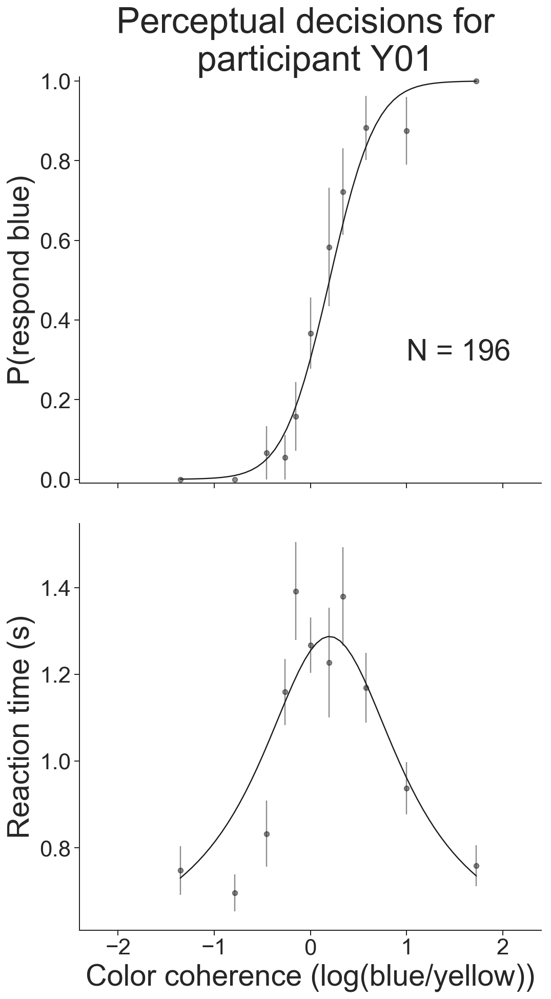

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


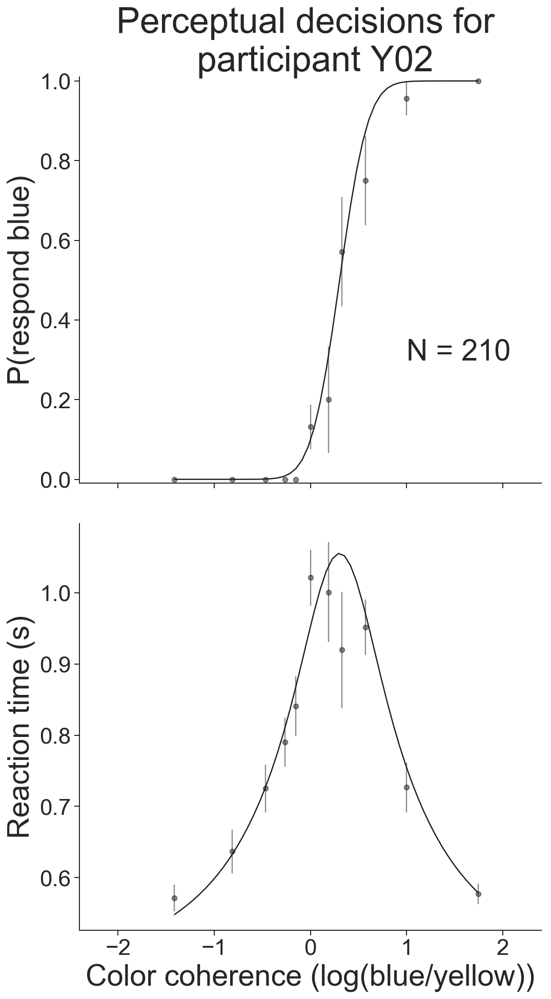

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


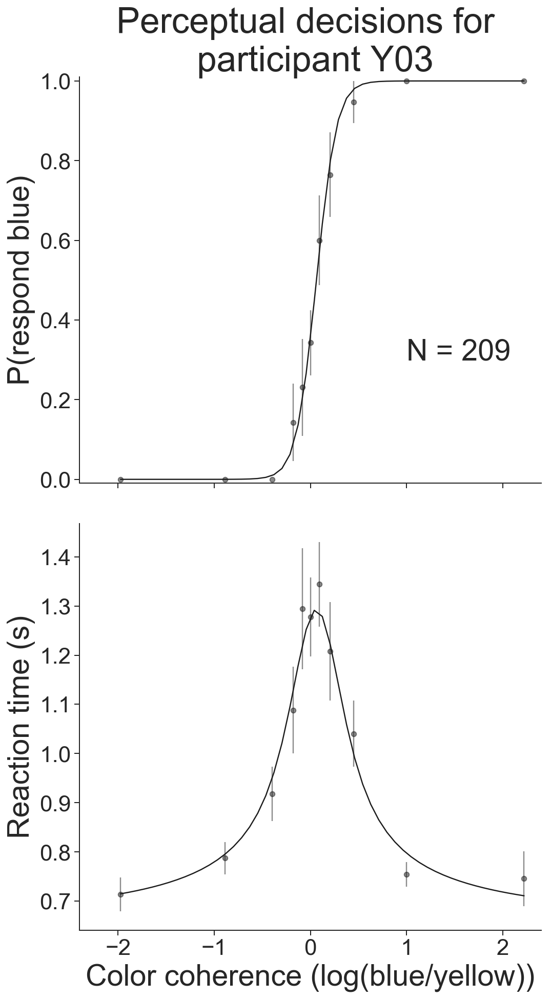

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


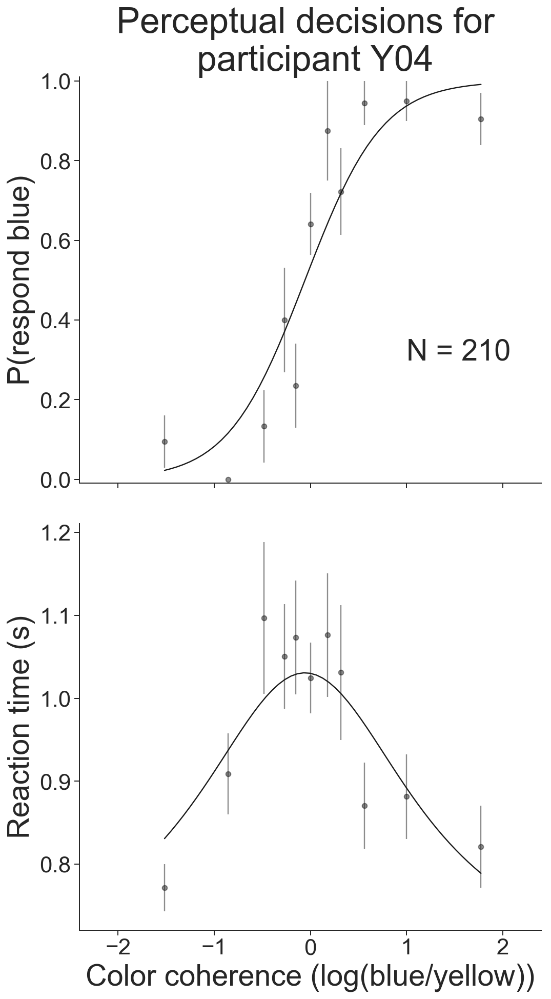

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


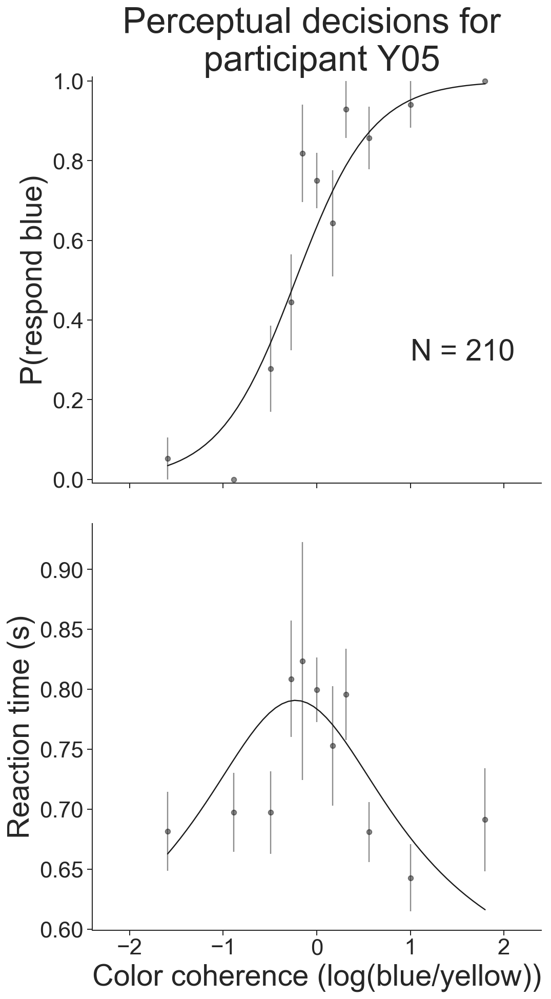

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


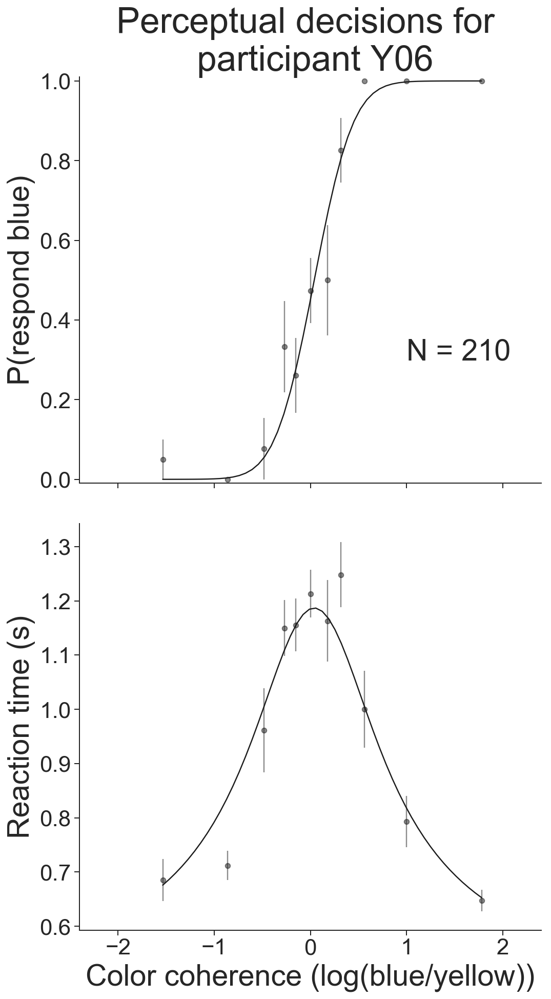

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


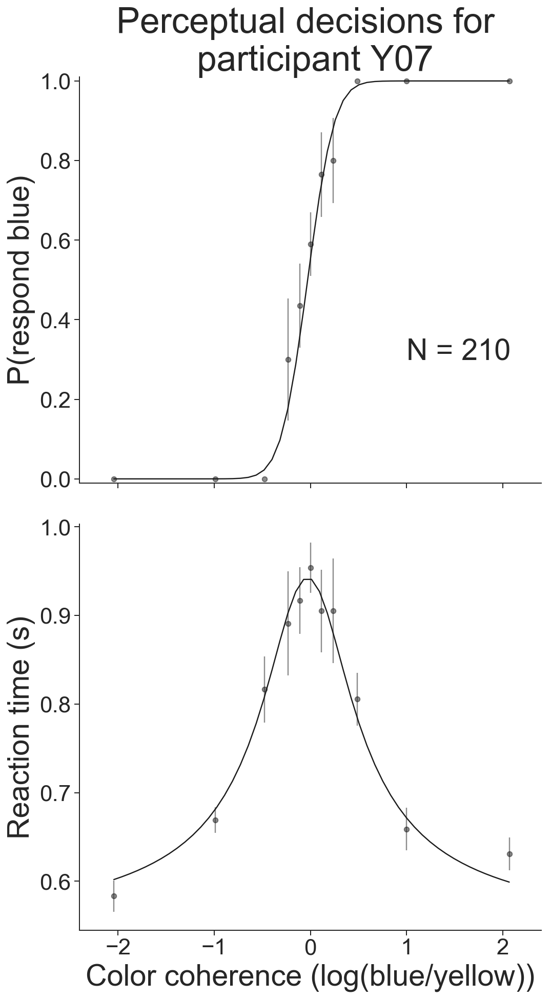

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


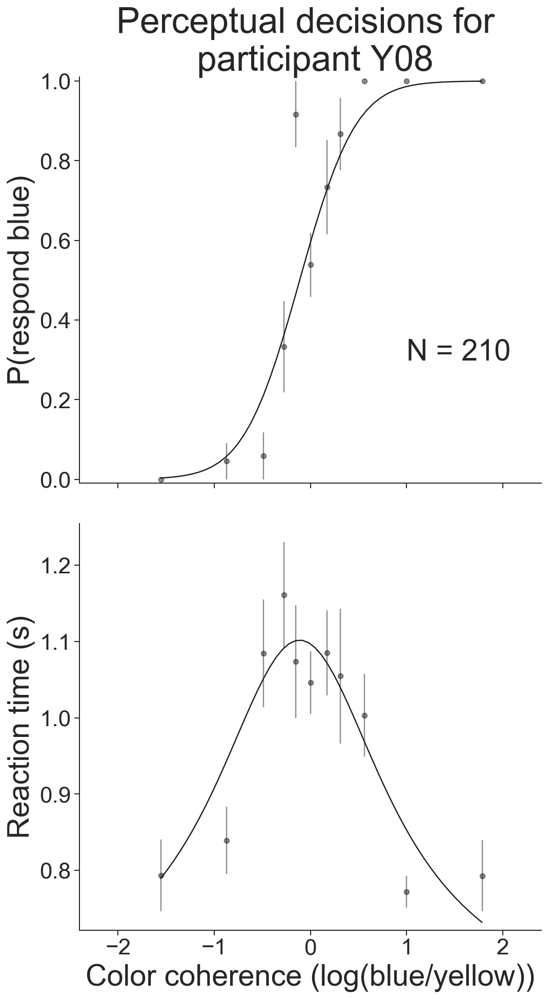

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


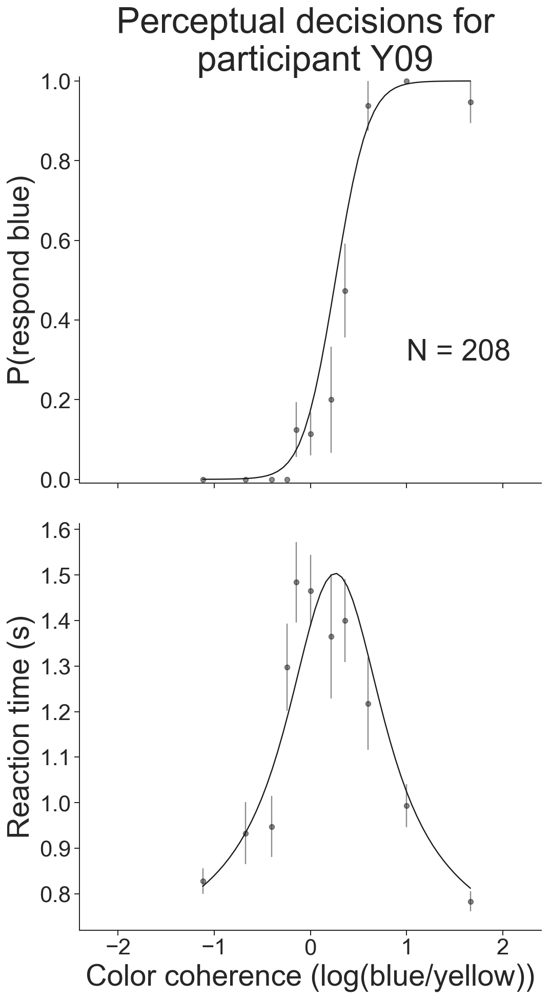

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


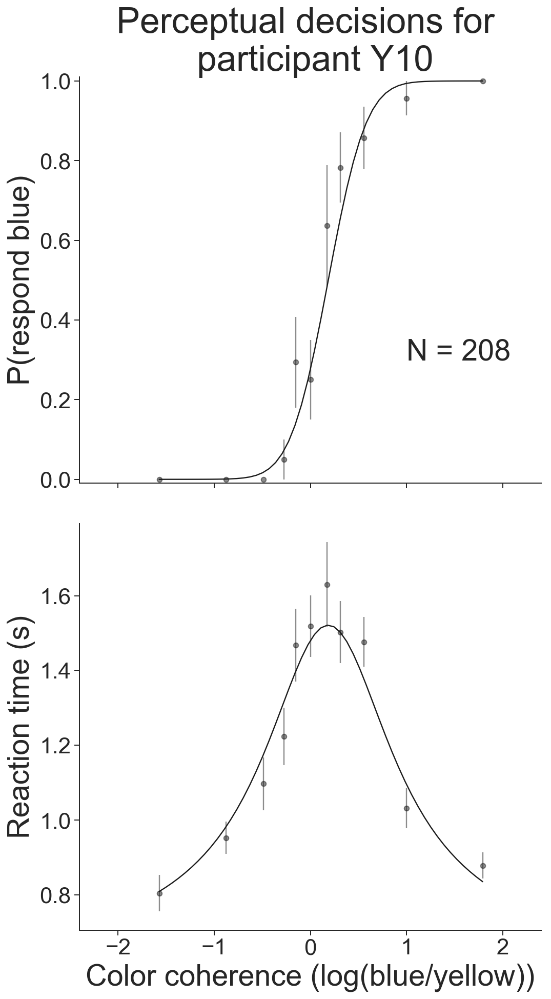

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


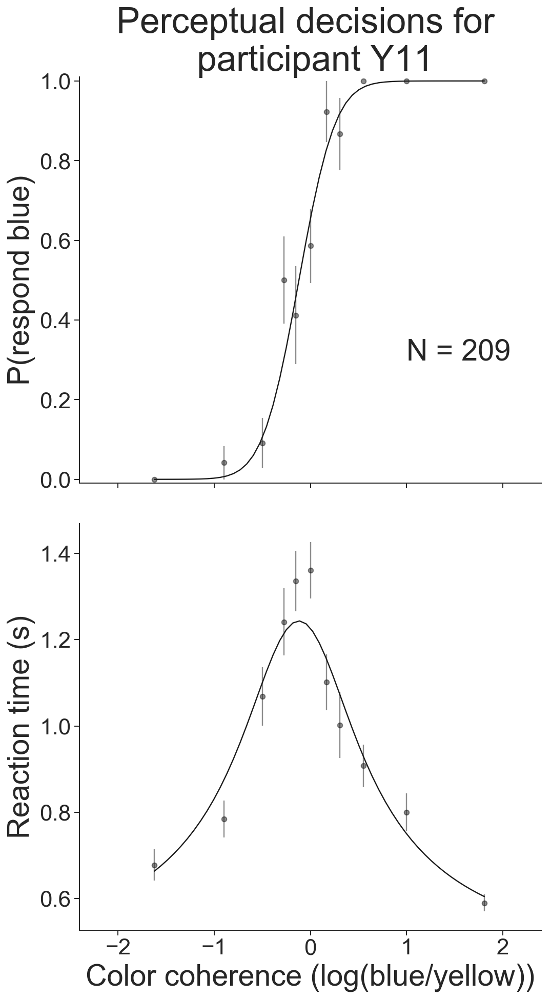

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


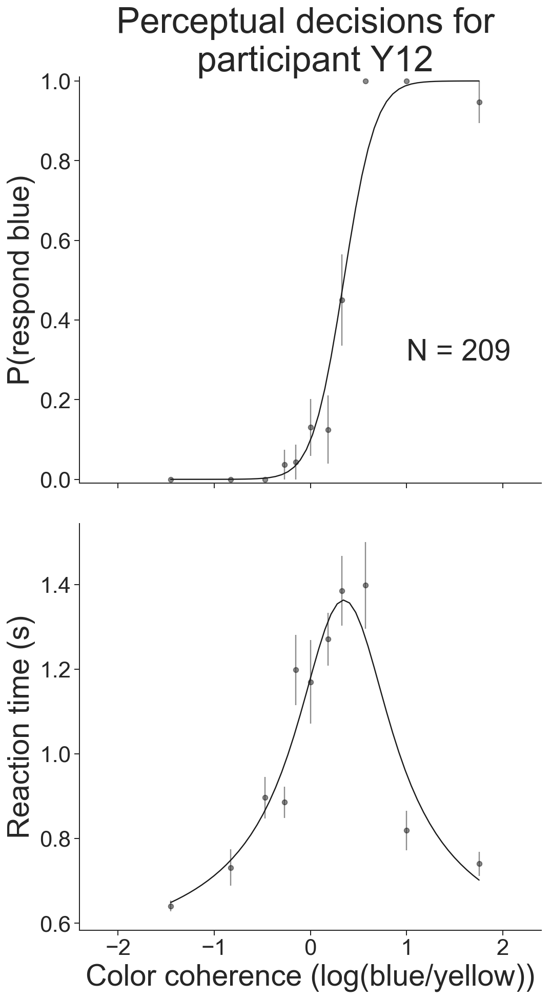

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


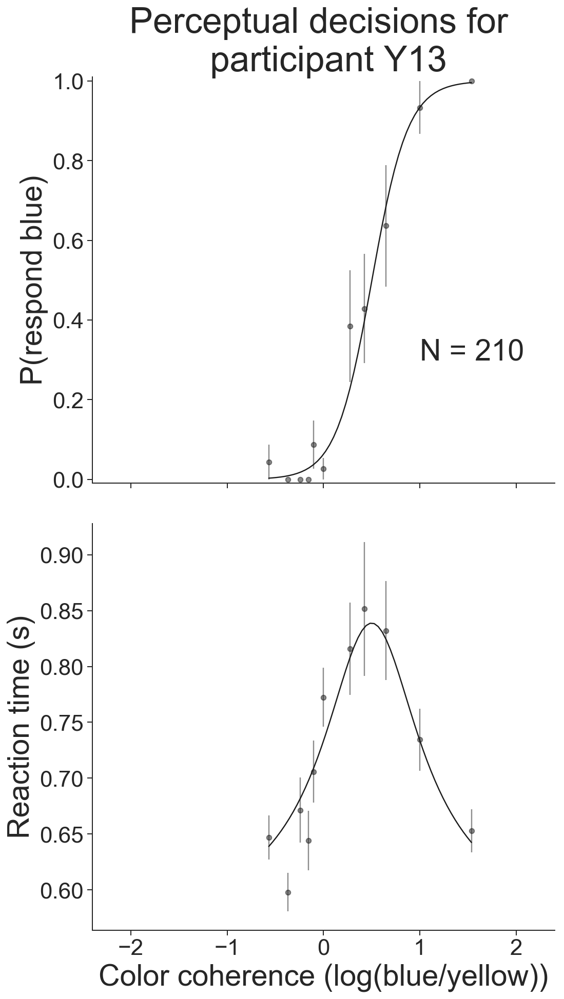

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


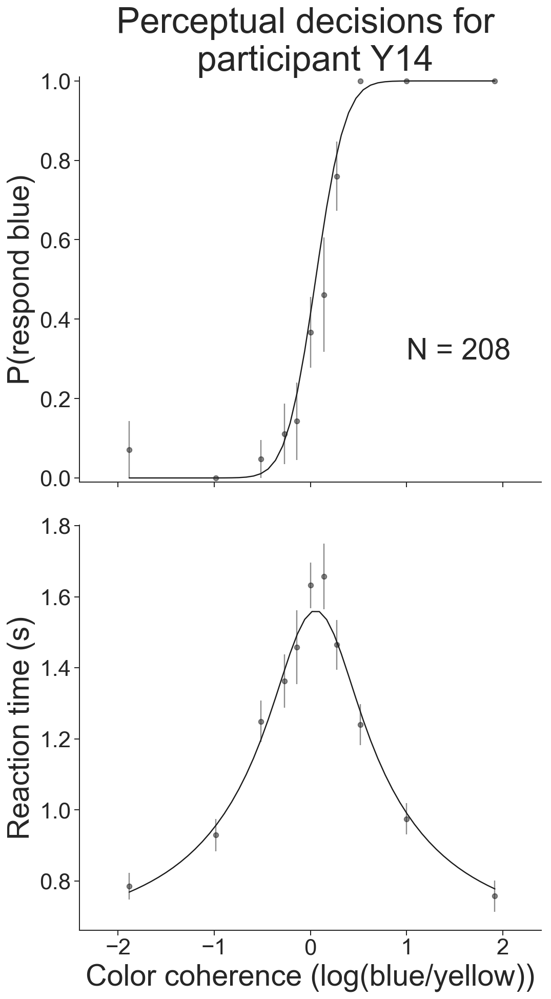

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


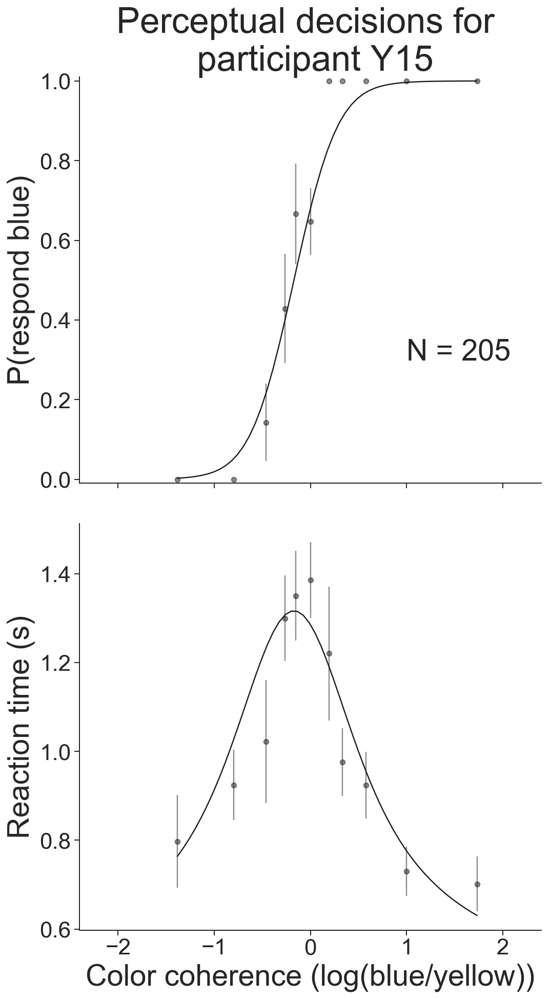

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


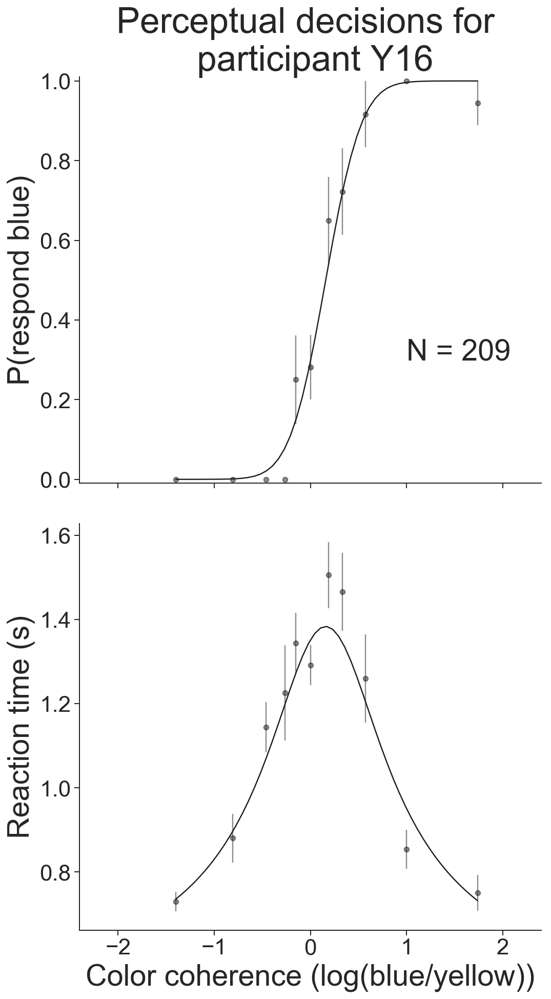

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


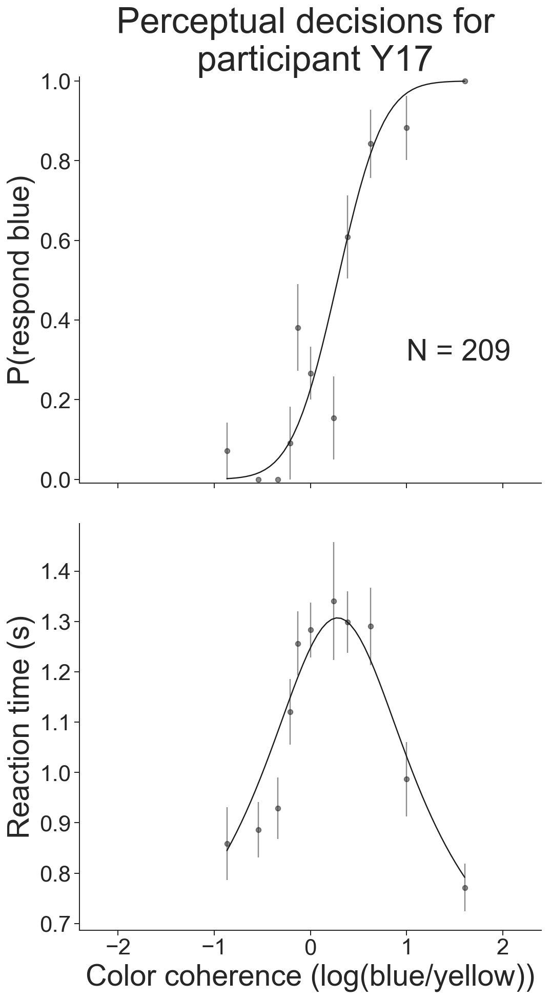

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


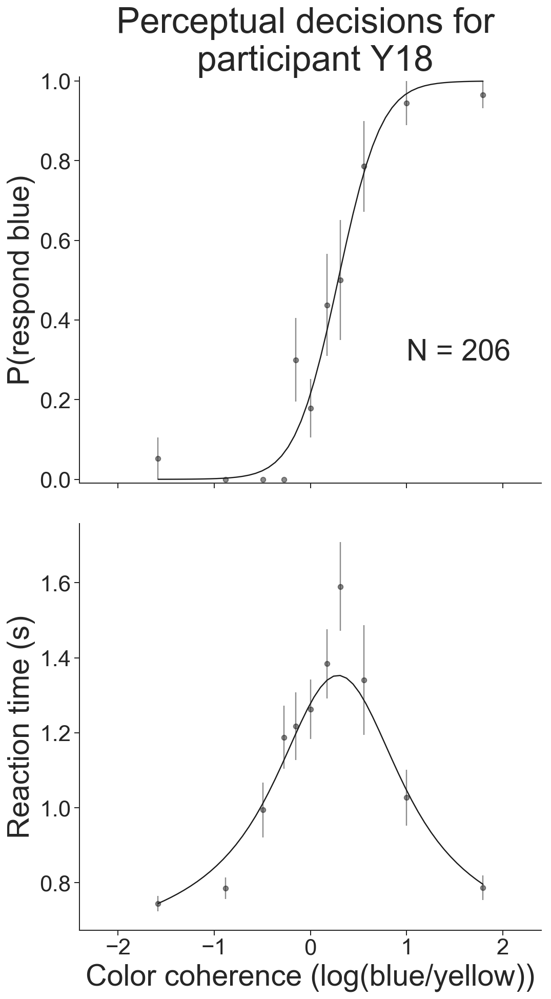

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


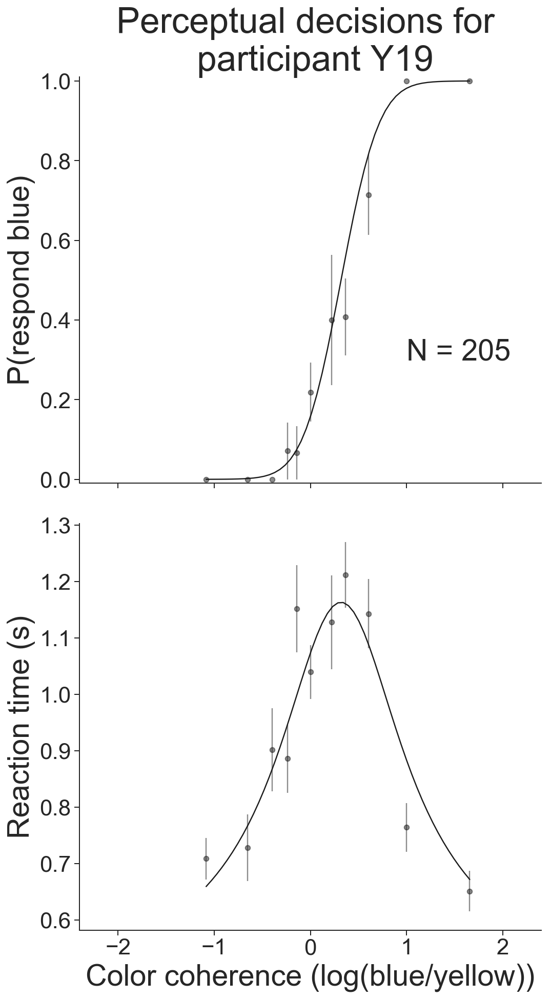

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


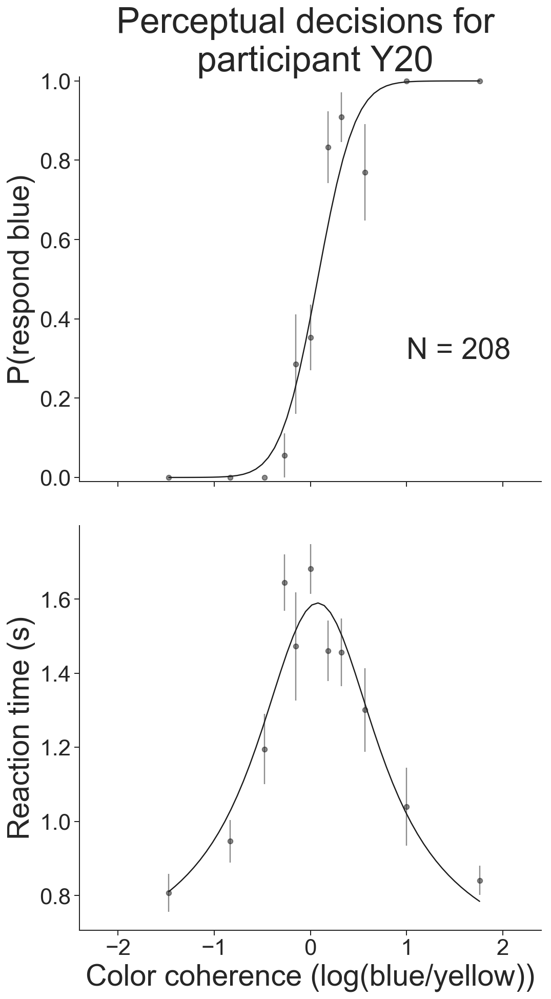

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


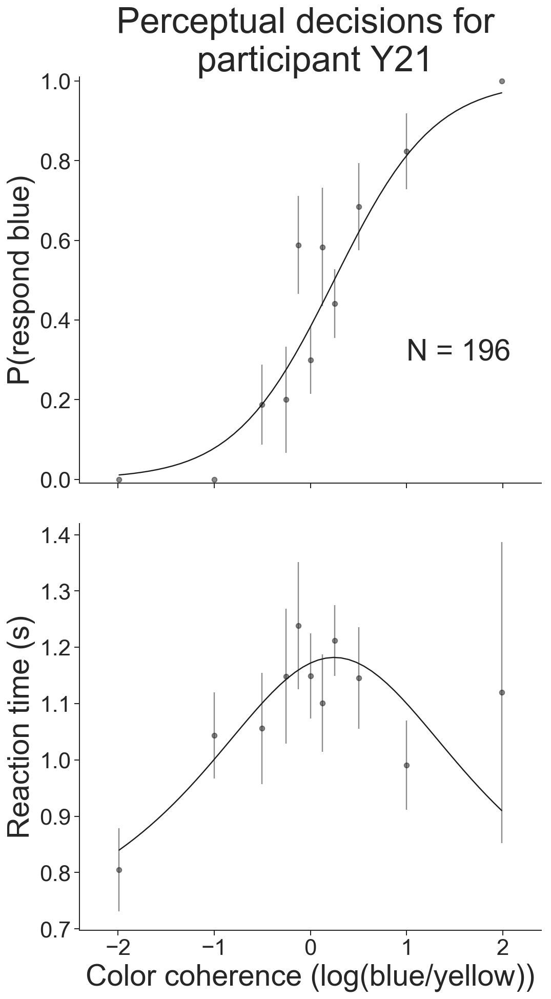

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


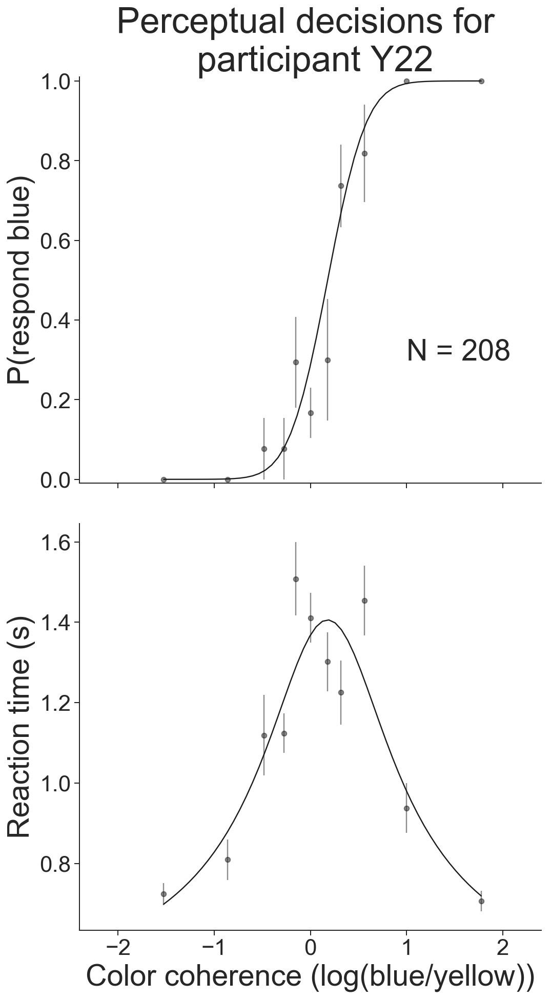

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


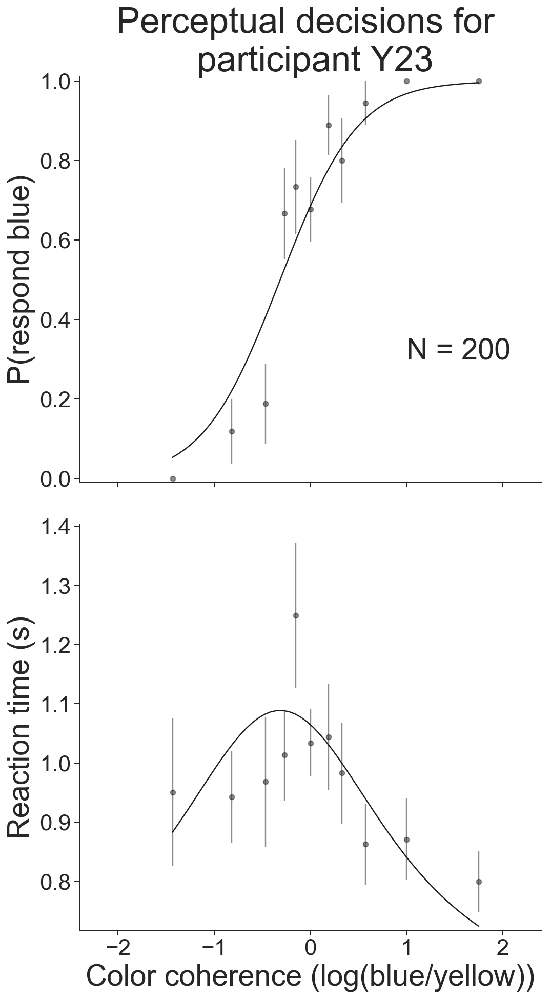

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


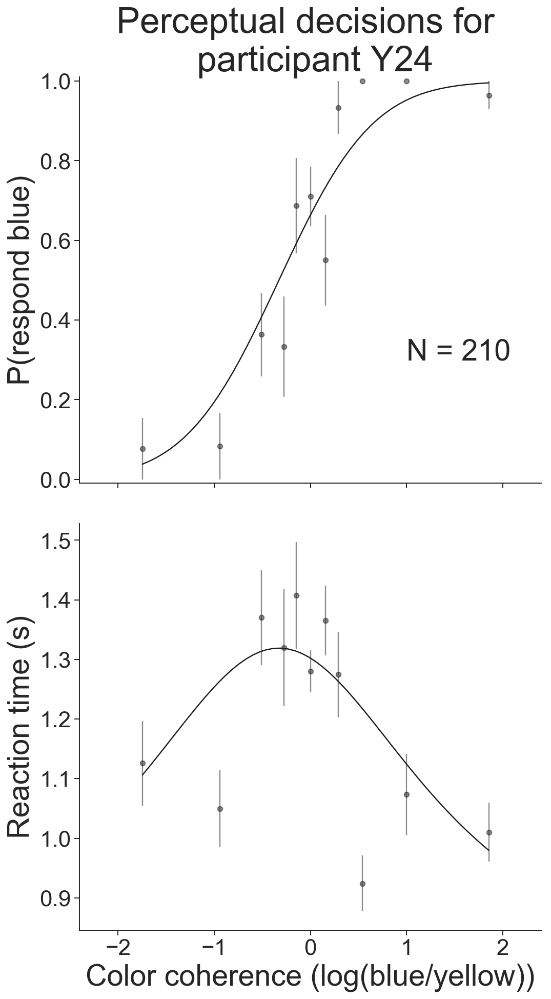

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


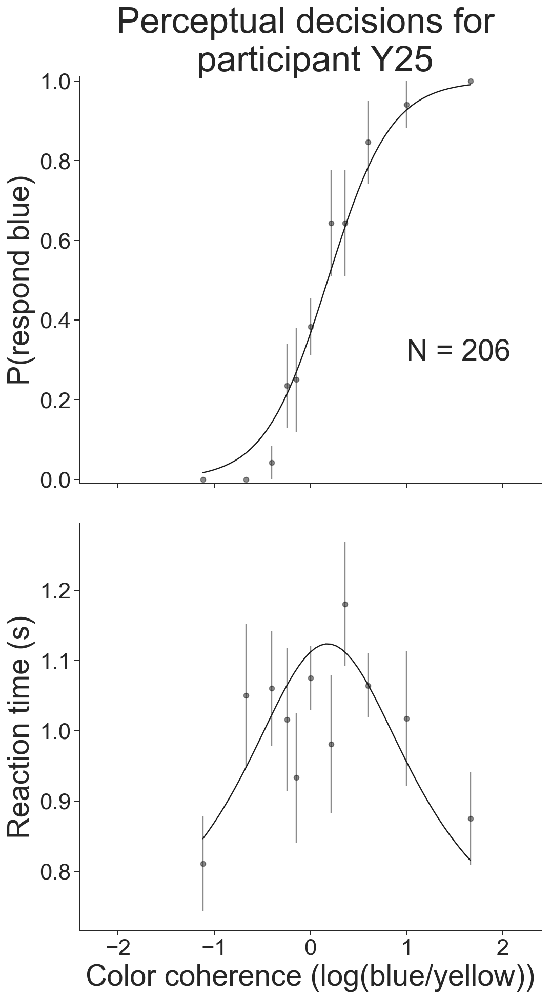

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


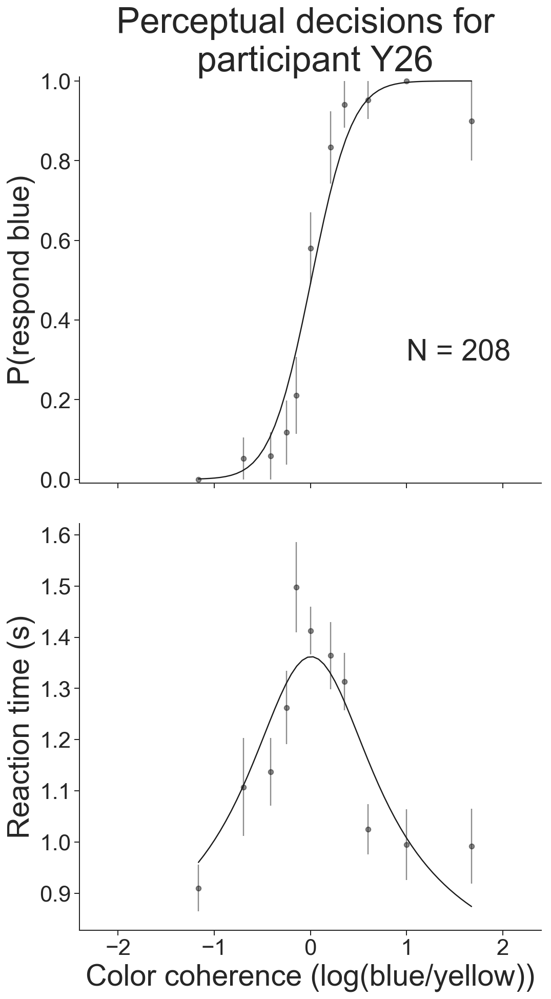

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


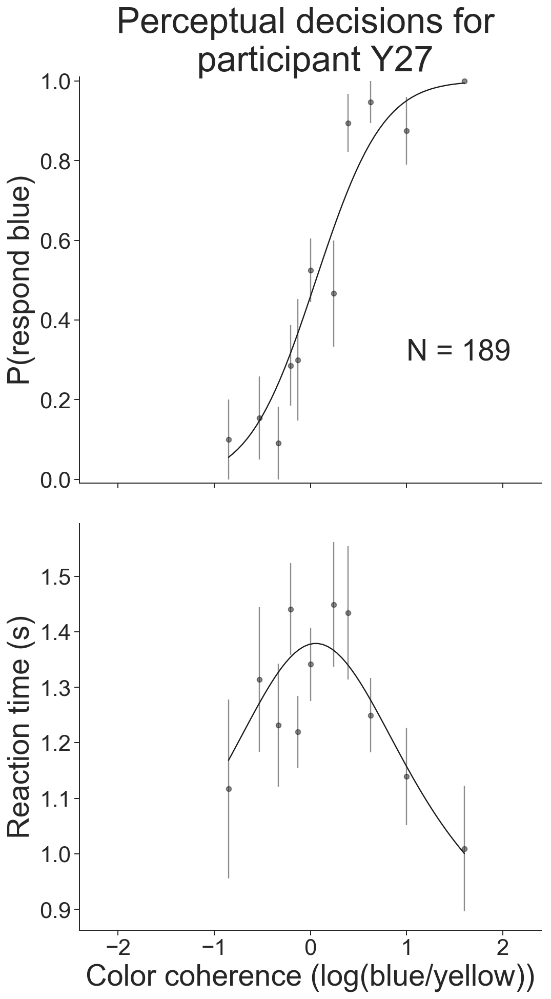

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


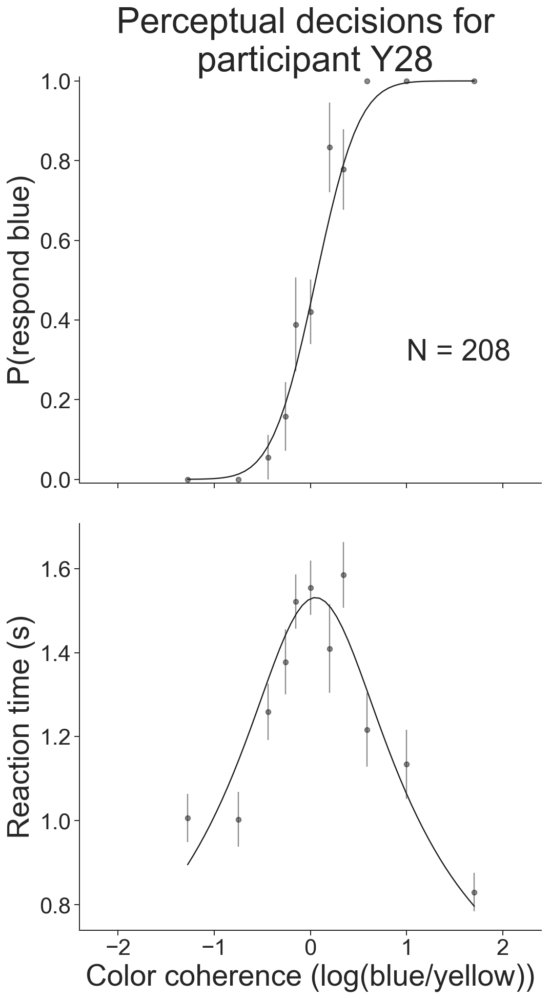

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


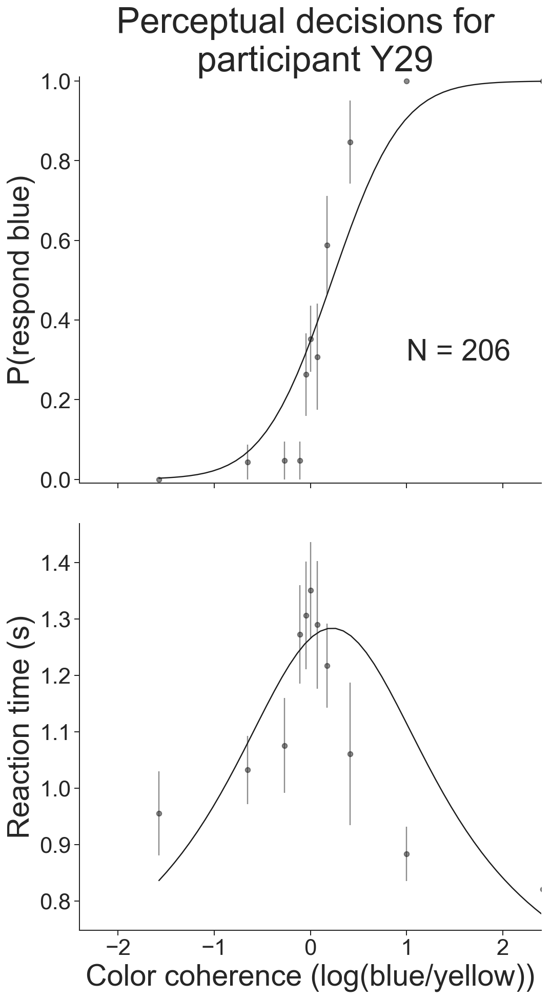

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


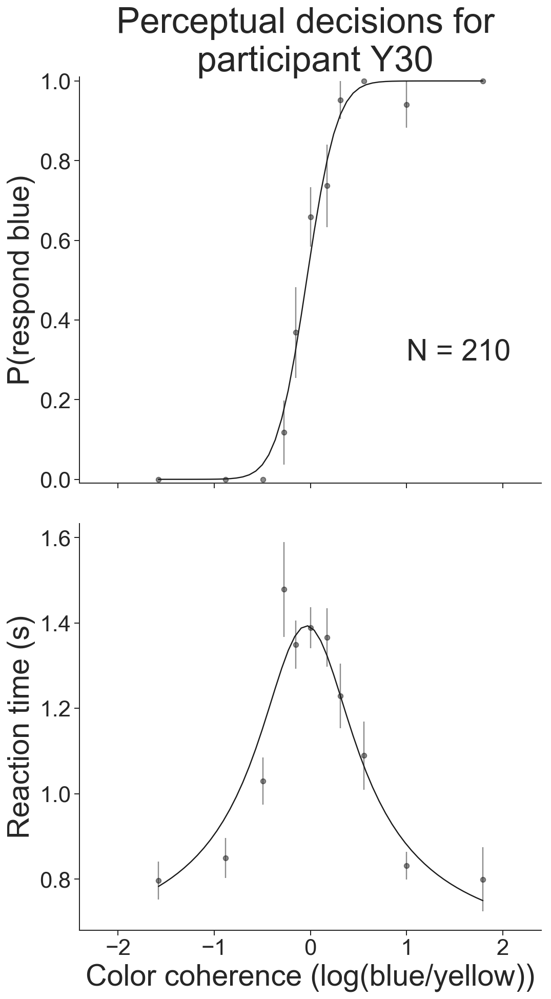

In [19]:
thetadotsallsub=pickle.load(open('thetadotsallsub.p','rb'))
sns.set(context='paper', style='white',font_scale=2.5)
sns.set_style('ticks')
dots=pd.read_csv("dots.csv")
subnum=1

for s in dots.subjid.unique():
    dotssub=dots[dots.subjid==s]
    data=np.column_stack([dotssub['color_coh'],dotssub['RT'],dotssub['choseblue'],dotssub['subjid']])
    theta=thetadotsallsub[thetadotsallsub.subjid==s].values[0][:9]
    plotDotsDataWithFitSub(data, theta, plotcolor='k', subnum='Y'+str(subnum).zfill(2), dt=.0005)
    subnum=subnum+1

## Food Choice
### Load in all food choice task data

In [20]:
# make list of files
filelist=[]
for s in subjid:
    filelist=filelist+glob.glob(datapath+'MDMRT_'+str(s).zfill(3)+'_food_choice_run_*m.txt')

# load data into dataframe
food=pd.read_table(filelist[0],sep=" ")
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep=" ")
    food=pd.concat([food,tmp])

### Compile food choice data for fit

In [21]:
# only take valid trials
food=pd.read_csv('food.csv')
isvalidtrial=food['Response']!='x'
food=food[isvalidtrial]

# code chose right
food=food.assign(choseright=food['Response'] == '4$')

# calculate deltavalue
food=food.assign(deltaval=food['bidRight']-food['bidLeft'])
food=food.assign(absdeltaval=np.abs(food.deltaval))


food.loc[(food.deltaval<=-1.5),'deltavalbin']=-2
food.loc[(food.deltaval<=-.75)&(food.deltaval>-1.5),'deltavalbin']=-1
food.loc[(food.deltaval<=-.375)&(food.deltaval>-.75),'deltavalbin']=-.5
food.loc[(food.deltaval<=-.1875)&(food.deltaval>-.375),'deltavalbin']=-.25
food.loc[(food.deltaval<=-.0625)&(food.deltaval>-.1875),'deltavalbin']=-.125
food.loc[(food.deltaval>-.0625)&(food.deltaval<.0625),'deltavalbin']=0
food.loc[(food.deltaval>=.0625)&(food.deltaval<.1875),'deltavalbin']=.125
food.loc[(food.deltaval>=.1875)&(food.deltaval<.375),'deltavalbin']=.25
food.loc[(food.deltaval>=.375)&(food.deltaval<.75),'deltavalbin']=.5
food.loc[(food.deltaval>=.75)&(food.deltaval<1.5),'deltavalbin']=1
food.loc[(food.deltaval>=1.5),'deltavalbin']=2

for b in food.deltavalbin.unique():
    food.loc[food.deltavalbin==b,'deltavalbinv']=food.loc[food.deltavalbin==b,'deltaval'].mean()

datafoodbin=np.column_stack([food['deltavalbin'],food['RT'],food['choseright'].astype('bool'),food['subjid']])


### Run fits on all trials and participants of food data

In [22]:
[thetafoodbin,foodfoptbin]=fitData(datafoodbin, dt=.0005)
pickle.dump([thetafoodbin,foodfoptbin],open( "fooddeltavalbinranges.p","wb"))

### Plot all trials and participants of food data with fits
#### Figure 2B

/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


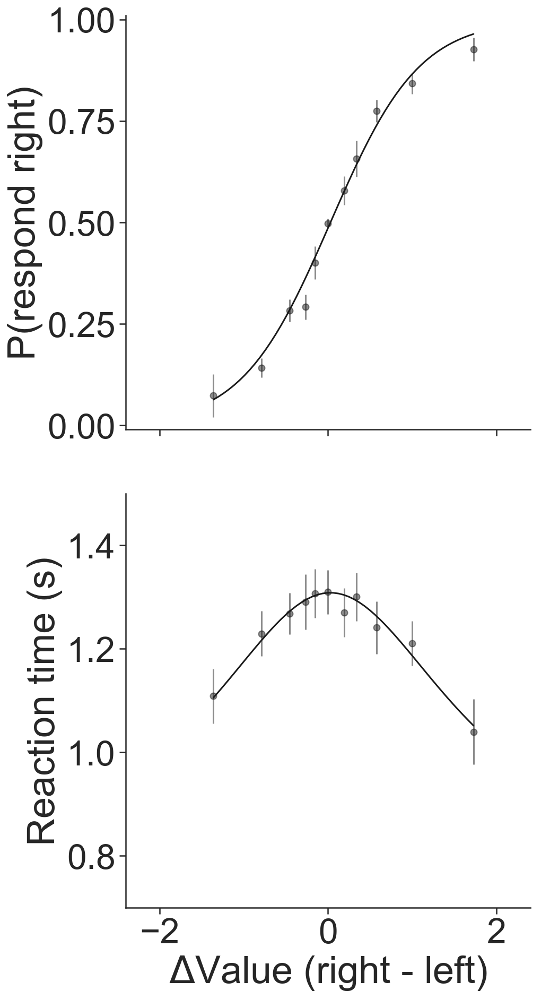

In [23]:
[thetafoodbin,foodfoptbin]=pickle.load(open( "fooddeltavalbinranges.p","rb"))

sns.set_context('talk')
sns.set(font_scale=3)
sns.set_style('ticks')
plotFoodDataWithFit(datafoodbin, thetafoodbin, dt=.0005)

### Food choice data logistic regression

/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
  res = PandasDataFrame.from_items(items)


Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: choseright ~ deltaval + (1 | subjid)
   Data: food

     AIC      BIC   logLik deviance df.resid 
  7726.2   7746.4  -3860.1   7720.2     6185 

Scaled residuals: 
     Min       1Q   Median       3Q      Max 
-13.1080  -0.9548  -0.1891   0.9808   6.2511 

Random effects:
 Groups Name        Variance Std.Dev.
 subjid (Intercept) 0.0188   0.1371  
Number of obs: 6188, groups:  subjid, 30

Fixed effects:
            Estimate Std. Error z value Pr(>|z|)    
(Intercept) -0.01918    0.03698  -0.519    0.604    
deltaval     1.78106    0.07907  22.525   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Effects:
         (Intr)
deltaval 0.031 
[1] "BOOTSTRAPPED CIs"
                  2.5 %     97.5 %
(Intercept) -0.09165677 0.05328907
deltaval     1.62608487 1.93603819


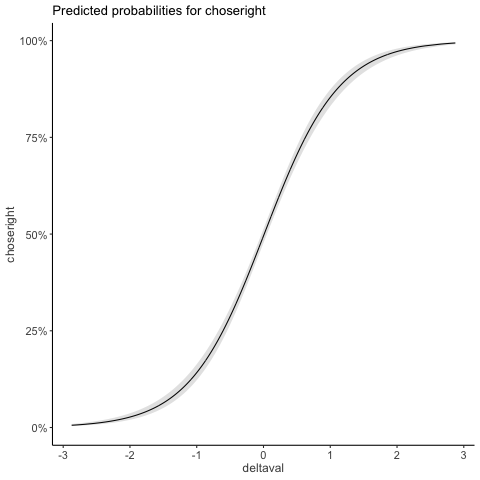

In [24]:
%%R -i food
foodchoicemod=glmer(choseright ~ deltaval + (1|subjid), family='binomial', data=food)

nranpars <- length(getME(foodchoicemod,"theta"))
nfixpars <- length(fixef(foodchoicemod))
confintfoodchoicemod=confint(foodchoicemod,method="boot", nsim=1000, parm=(nranpars+1):(nranpars+nfixpars), parallel="multicore", ncpus=8)


save(foodchoicemod,confintfoodchoicemod, file = "foodchoicemod.RData")
load("foodchoicemod.RData")

print(summary(foodchoicemod))
print("BOOTSTRAPPED CIs")
print(confintfoodchoicemod)

set_theme(theme_classic())
plot_model(foodchoicemod,type='eff',terms='deltaval',show.ci=TRUE)

### Food RT data linear regression model

In [25]:
# RT mixed effects linear model
food=food.assign(absdeltaval=food['deltaval'].abs())
foodmd = smf.mixedlm('RT ~ absdeltaval', food, groups=food['subjid'])
foodmdf = foodmd.fit()
print(foodmdf.summary())

         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: RT        
No. Observations: 6188    Method:             REML      
No. Groups:       30      Scale:              0.1587    
Min. group size:  185     Likelihood:         -3152.0425
Max. group size:  210     Converged:          Yes       
Mean group size:  206.3                                 
--------------------------------------------------------
             Coef.  Std.Err.    z    P>|z| [0.025 0.975]
--------------------------------------------------------
Intercept     1.315    0.040  32.930 0.000  1.237  1.394
absdeltaval  -0.109    0.011 -10.219 0.000 -0.130 -0.088
Group Var     0.047    0.031                            



/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
  res = PandasDataFrame.from_items(items)


Linear mixed model fit by REML. t-tests use Satterthwaite's method [
lmerModLmerTest]
Formula: RT ~ absdeltaval + (1 | subjid)
   Data: food

REML criterion at convergence: 6304.1

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-2.7386 -0.6745 -0.1526  0.5108  4.4260 

Random effects:
 Groups   Name        Variance Std.Dev.
 subjid   (Intercept) 0.04682  0.2164  
 Residual             0.15871  0.3984  
Number of obs: 6188, groups:  subjid, 30

Fixed effects:
              Estimate Std. Error         df t value Pr(>|t|)    
(Intercept)    1.31526    0.03996   29.38038   32.91   <2e-16 ***
absdeltaval   -0.10905    0.01067 6163.62172  -10.22   <2e-16 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Effects:
            (Intr)
absdeltaval -0.081
[1] "BOOTSTRAPPED CIs"
                 2.5 %    97.5 %
(Intercept)  1.2369404  1.393581
absdeltaval -0.1299627 -0.088134


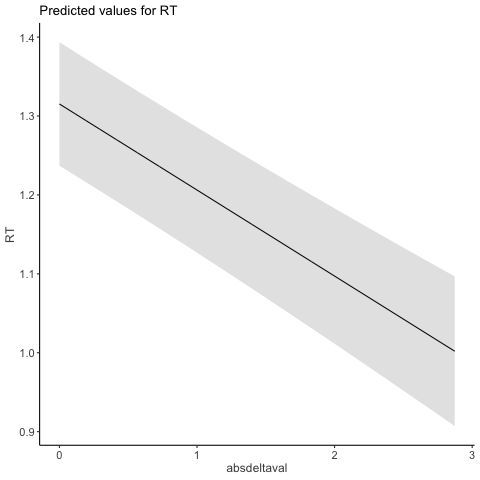

In [26]:
%%R -i food
## compare the model using python's statsmodels to R's lme4
foodrtmod=lmer(RT ~ absdeltaval + (1|subjid), data=food)

nranpars <- length(getME(foodrtmod,"theta"))
nfixpars <- length(fixef(foodrtmod))
confintfoodchoicemod=confint(foodrtmod,method="boot", nsim=1000, parm=(nranpars+2):(nranpars+nfixpars+1), parallel="multicore", ncpus=8)


save(foodrtmod,confintfoodrtmod, file = "foodrtmod.RData")
load("foodrtmod.RData")

print(summary(foodrtmod))
print("BOOTSTRAPPED CIs")
print(confintfoodrtmod)

set_theme(theme_classic())
plot_model(foodrtmod,type='eff',terms='absdeltaval',show.ci=TRUE)

### Plot trials per participants of food data with fits
#### Figure 2—figure supplement 1

In [27]:
def do_fit_foodsub(i):
    food=pd.read_csv('food.csv')
    food['deltavalrnd']=food['deltaval'].round(1)
    uni_sub=food.subjid.unique()
    s=uni_sub[i]
    foodsub=food[food['subjid']==s]
    datafood=np.column_stack([foodsub['deltavalrnd'],foodsub['RT'],foodsub['choseright']])
    [thetafoodsub,fopt]=fitData(datafood)
    tmp=thetafoodsub.tolist()
    tmp.append(fopt)
    tmp.append(s)
    return tmp

food=pd.read_csv('food.csv')
food['deltavalrnd']=food['deltaval'].round(1)
# run fits in parallel
inputs = range(len(food['subjid'].unique()))
num_cores = multiprocessing.cpu_count()
results = Parallel(n_jobs=num_cores)(delayed(do_fit_foodsub)(i) for i in inputs)
    
thetafoodallsub=pd.DataFrame(results,columns=['k', 'B0', 'Bdel', 'B2', 'tnd', 'tnd_sd', 'stim_strength_bias', 'y0', 'plaw','nll','subjid'])
pickle.dump(thetafoodallsub,open("thetafoodallsub.p","wb"))


/Users/akram/anaconda3/lib/python3.6/site-packages/numpy/core/numeric.py:531: ComplexWarning: Casting complex values to real discards the imaginary part
  return array(a, dtype, copy=False, order=order)
/Users/akram/anaconda3/lib/python3.6/site-packages/matplotlib/transforms.py:963: ComplexWarning: Casting complex values to real discards the imaginary part
  self._points[:, 0] = interval


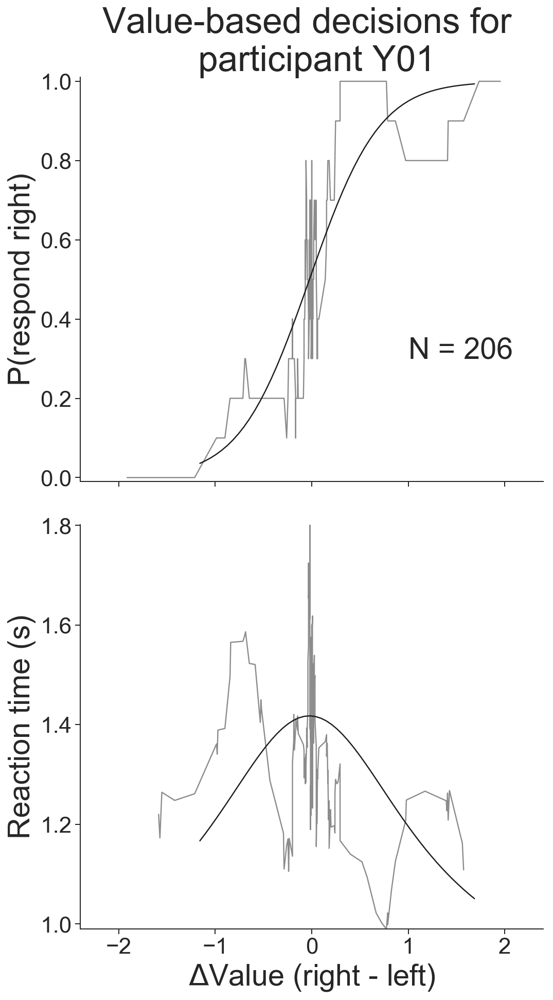

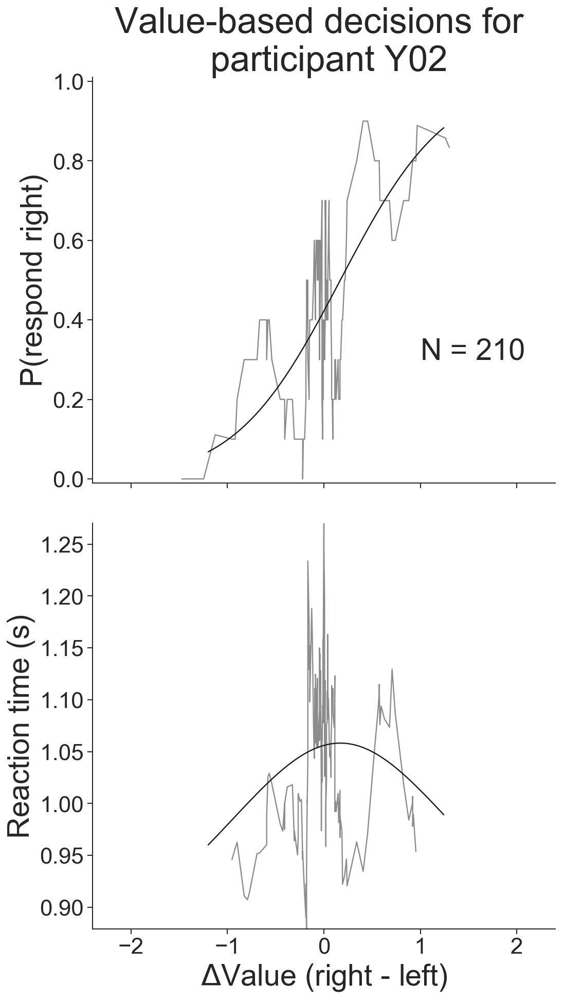

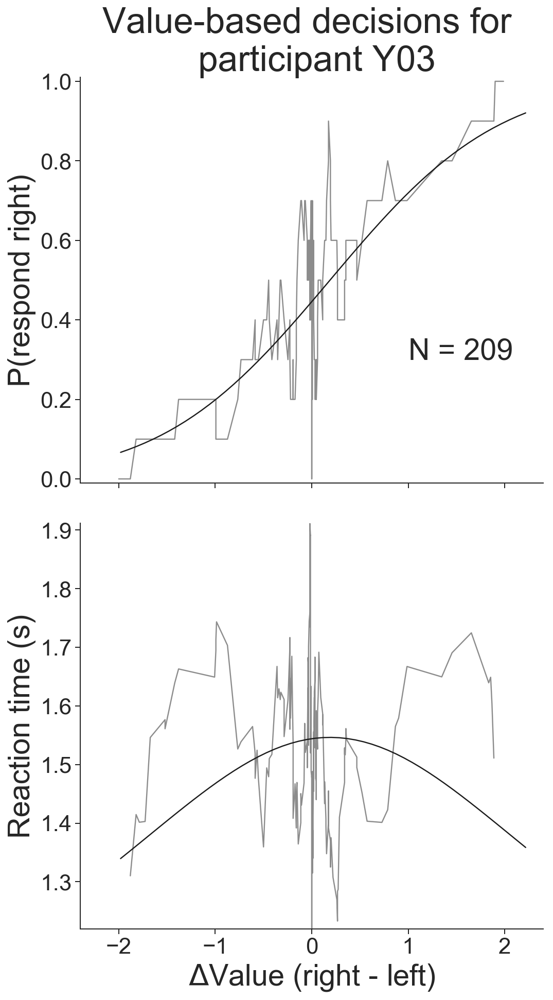

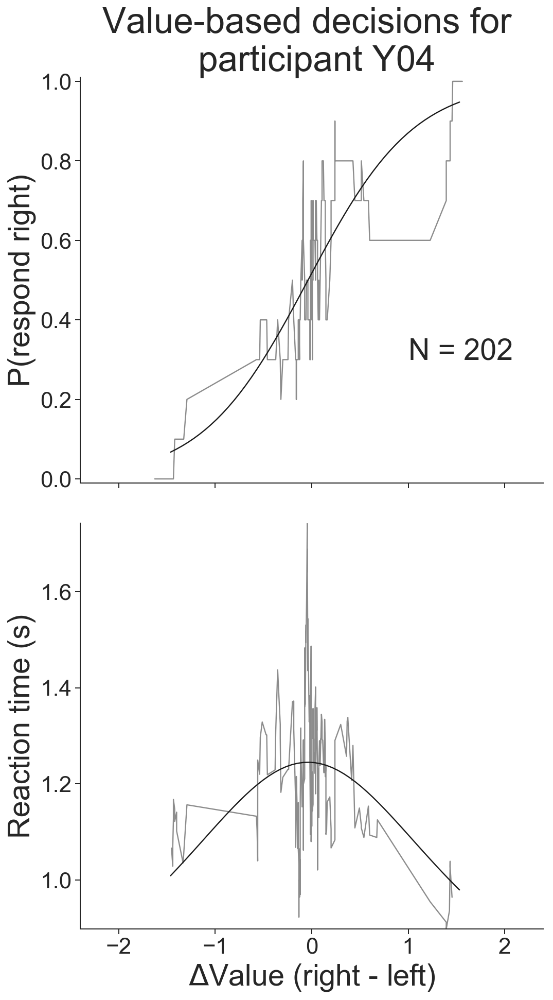

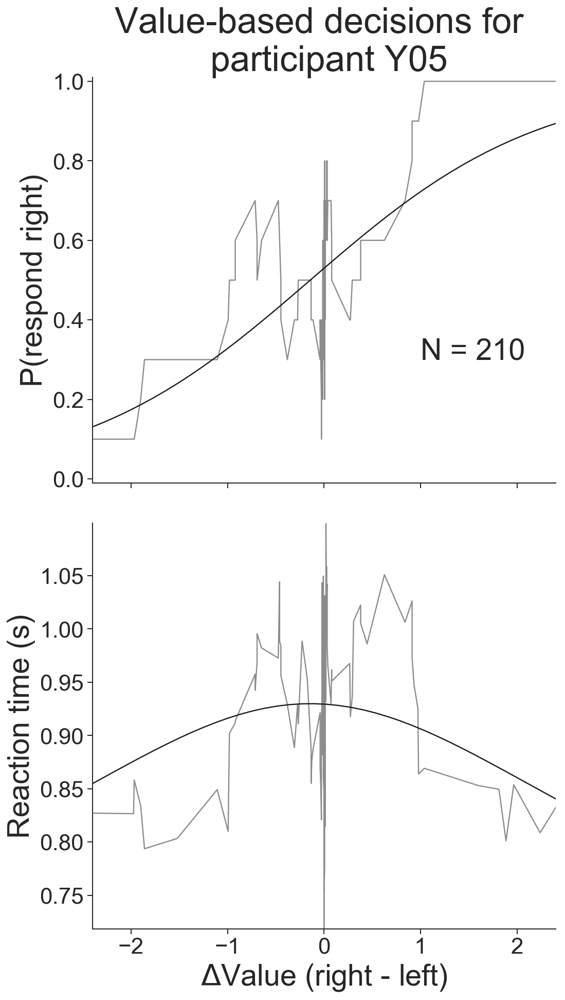

...

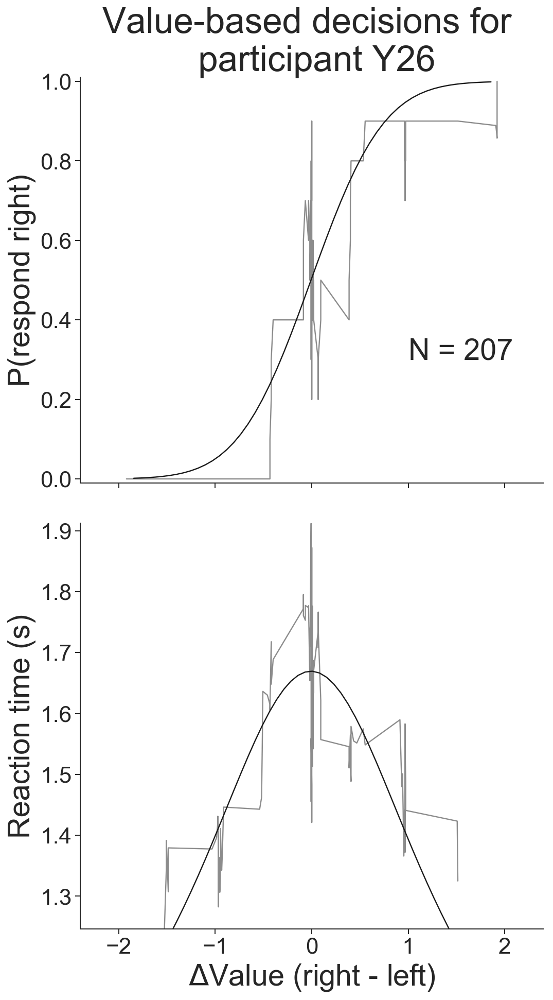

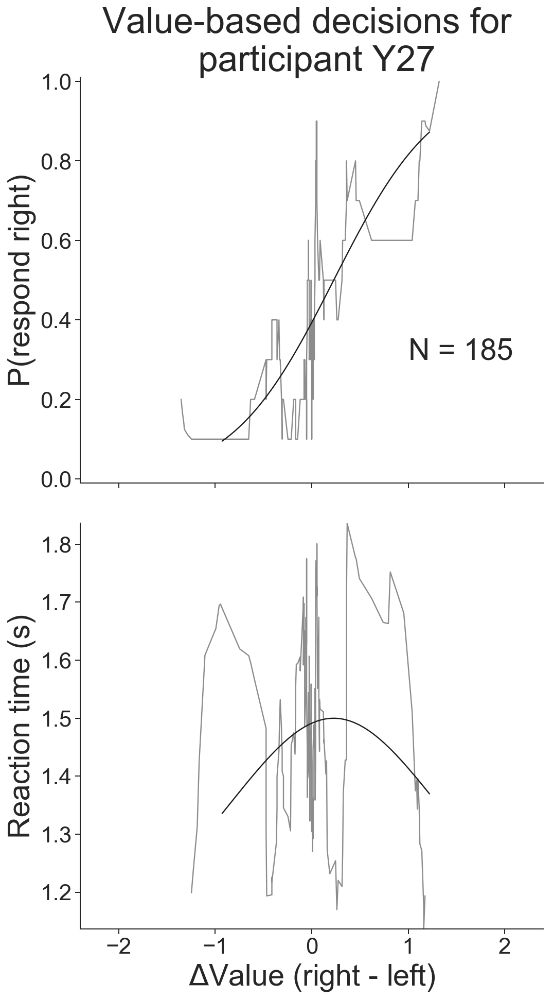

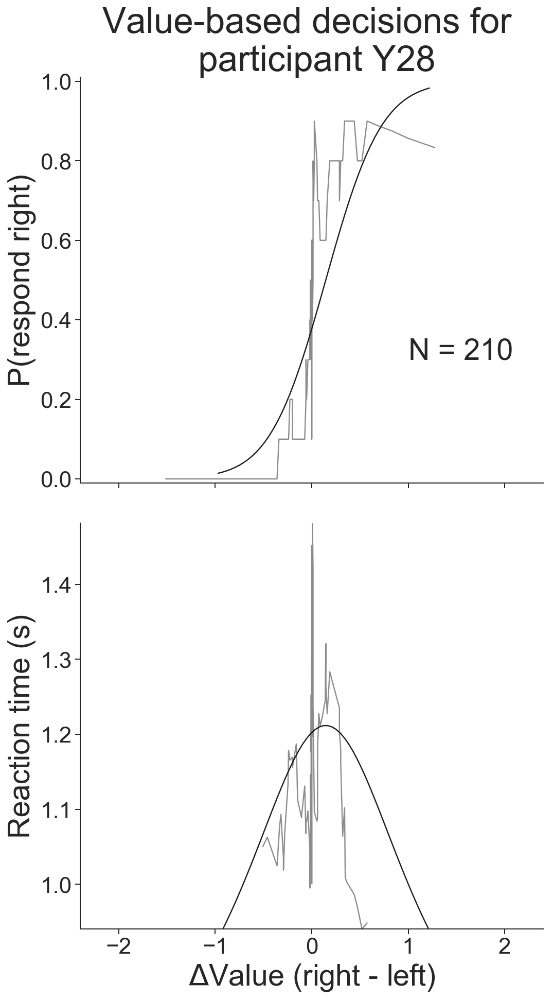

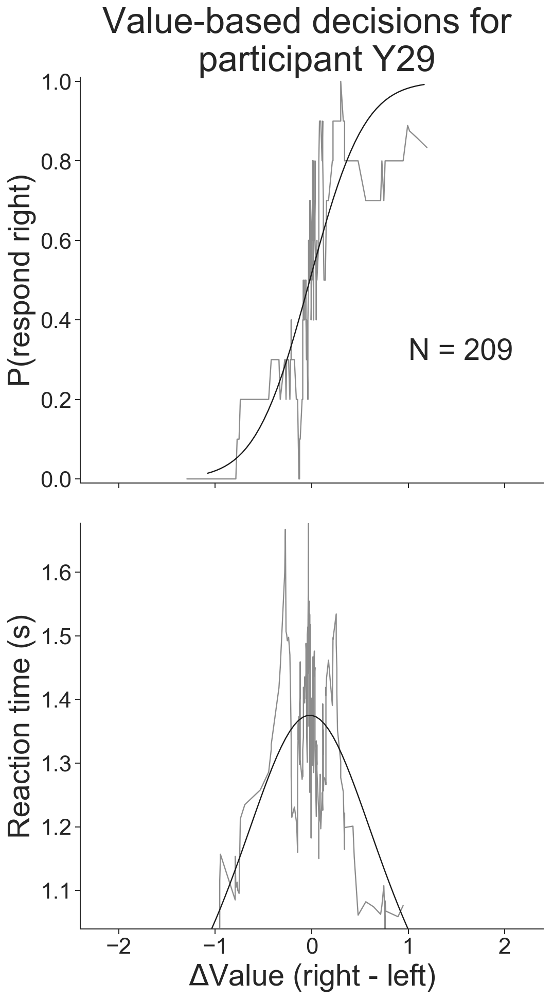

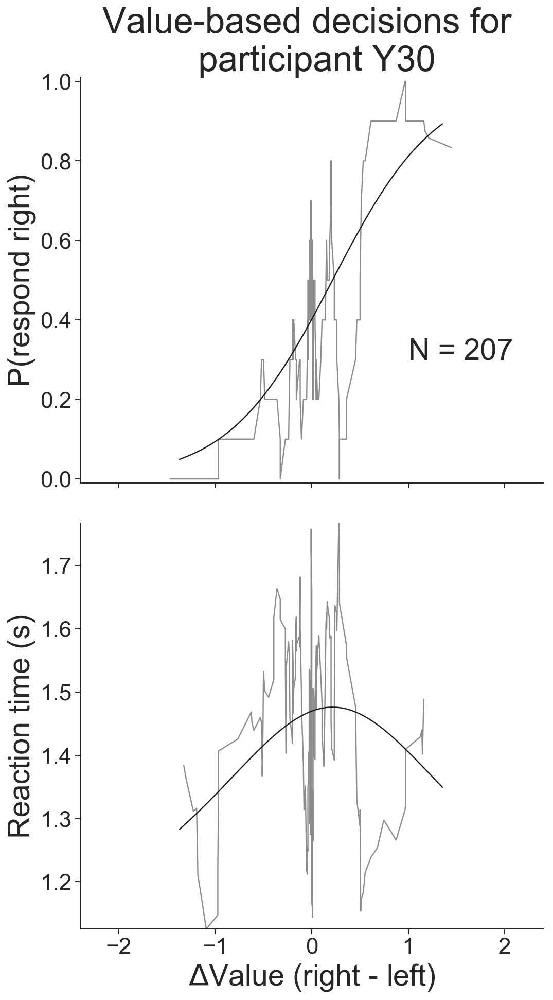

In [28]:
thetafoodallsub=pickle.load(open("thetafoodallsub.p","rb"))
sns.set(context='paper', style='white',font_scale=2.5)
sns.set_style('ticks')
food=pd.read_csv("food.csv")
food['deltavalrnd']=food['deltaval'].round(1)
subnum=1

for s in food.subjid.unique():
    foodsub=food[food.subjid==s]
    
    data=np.column_stack([foodsub['deltavalrnd'],foodsub['RT'],foodsub['choseright'],foodsub['subjid'],foodsub['deltaval']])

    theta=thetafoodallsub[thetafoodallsub.subjid==s].values[0][:9]
    plotFoodDataWithFitSub(data, theta, plotcolor='k', subnum='Y'+str(subnum).zfill(2), dt=.0005)
    subnum=subnum+1

## fMRI maps
### Memory Hits > Correct Rejections
#### Figure 3—figure supplement 2

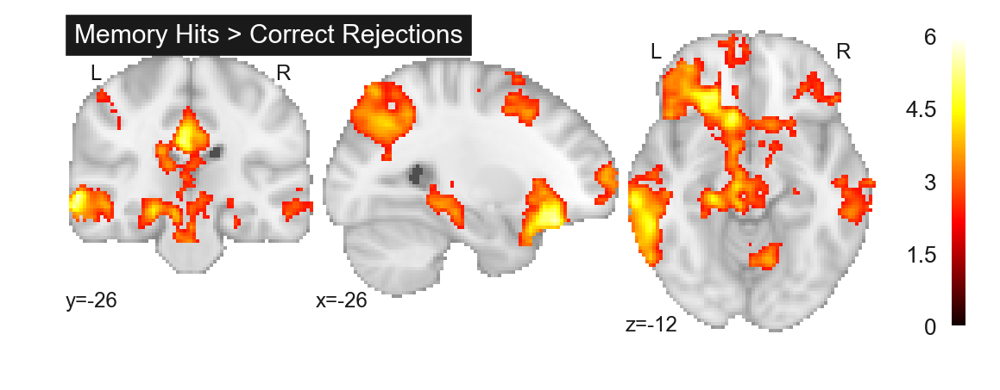

In [29]:
## path to imaging data
imgpath='MDMRT_scan'


## Map of Memory hits > correct rejections model001 task003 cope014 
memory_map=nilearn.image.load_img(imgpath +'/group/model001/task003/cope014.gfeat/cope1.feat/thresh_zstat1.nii.gz')

nilearn.plotting.plot_stat_map(memory_map,cut_coords=[-26,-26,-12],draw_cross=False, 
                               title="Memory Hits > Correct Rejections")
plt.show()


### Conjunction Map of (Value-based RT > Perceptual RT) & (Memory hits > correct rejections)
#### Figure 3

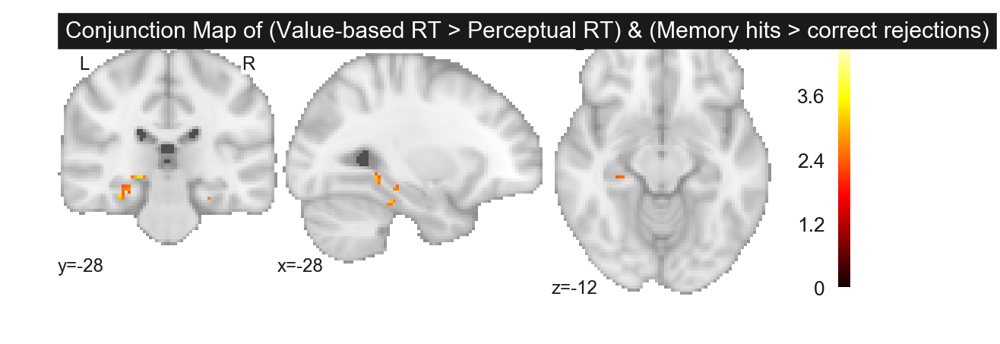

In [30]:
## Conjunction Map of (Value-based RT > Perceptual RT: model002 t1c2mint2c2 cope001) & (Memory hits > correct rejections model001 task003 cope014)

conjunction_map=nilearn.image.load_img(imgpath +'/group/model002/task1_v_task2/t1_rtall_v_t2_rtall_conj_memHitsvCR.gfeat/cope1.feat/thresh_zstat1.nii.gz')

nilearn.plotting.plot_stat_map(conjunction_map,cut_coords=[-28,-28,-12],draw_cross=False, 
                               title="Conjunction Map of (Value-based RT > Perceptual RT) & (Memory hits > correct rejections)")
plt.show()

### Map of Main effect (intercept) of Value-based onset > Perceptual onset
#### Figure 3—figure supplement 4A

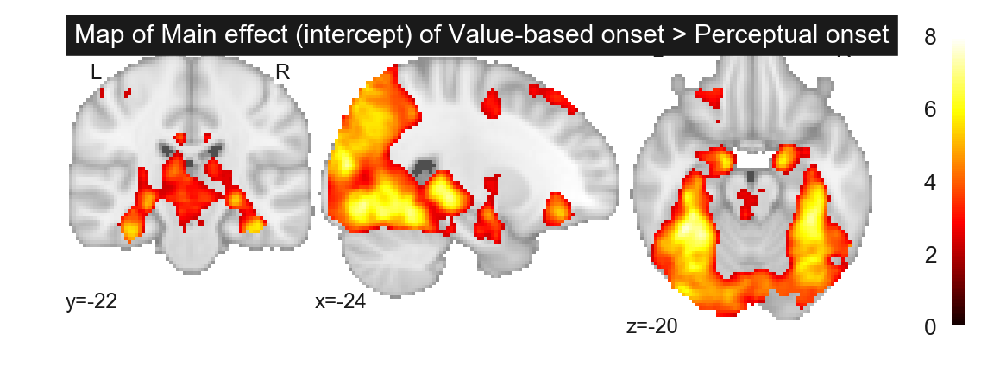

In [31]:
## Map of Main effect (intercept) of Value-based onset > Perceptual onset

t1vt2_onset_map=nilearn.image.load_img(imgpath +'/group/model002/task1_v_task2/t1c1mint2c1.gfeat/cope1.feat/thresh_zstat1.nii.gz')

nilearn.plotting.plot_stat_map(t1vt2_onset_map,cut_coords=[-24,-22,-20],draw_cross=False, 
                               title="Map of Main effect (intercept) of Value-based onset > Perceptual onset")
plt.show()


### Map of Value-based RT (range restricted) > Perceptual RT (range restricted)
#### Figure 3—figure supplement 4B

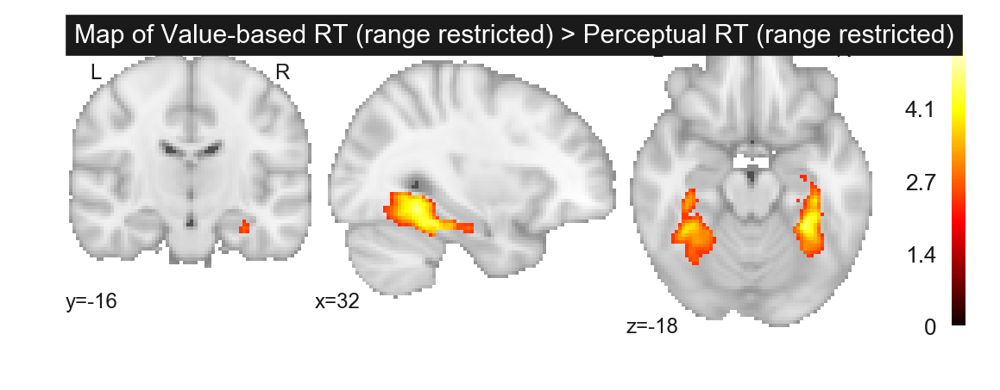

In [32]:
## Map of Value-based RT (range restricted) > Perceptual RT (range restricted) to RT range overlap between two tasks:

t1vt2rtrestricted_map=nilearn.image.load_img(imgpath +'/group/model003/task1_v_task2/t1c2vt2c2.gfeat/cope1.feat/thresh_zstat1.nii.gz')

nilearn.plotting.plot_stat_map(t1vt2rtrestricted_map,cut_coords=[32,-16,-18],draw_cross=False, 
                               title="Map of Value-based RT (range restricted) > Perceptual RT (range restricted)")
plt.show()

### Maps of VB RT, Perceptual RT, and VB RT > Perceptual RT
#### Figure 3—figure supplement 7

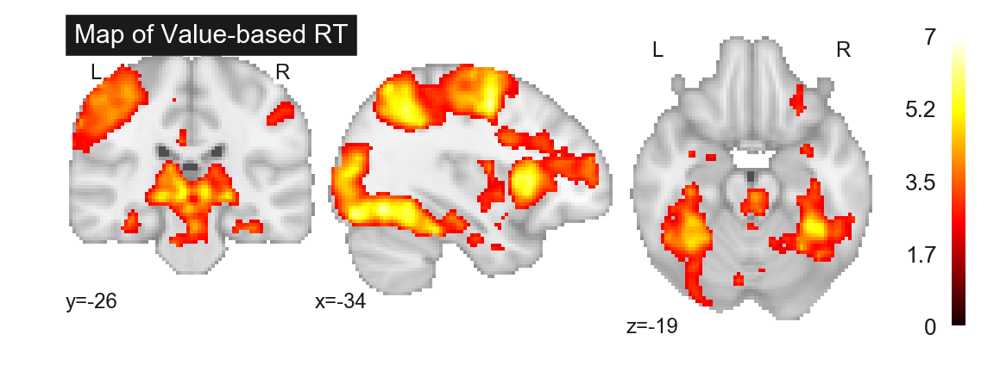

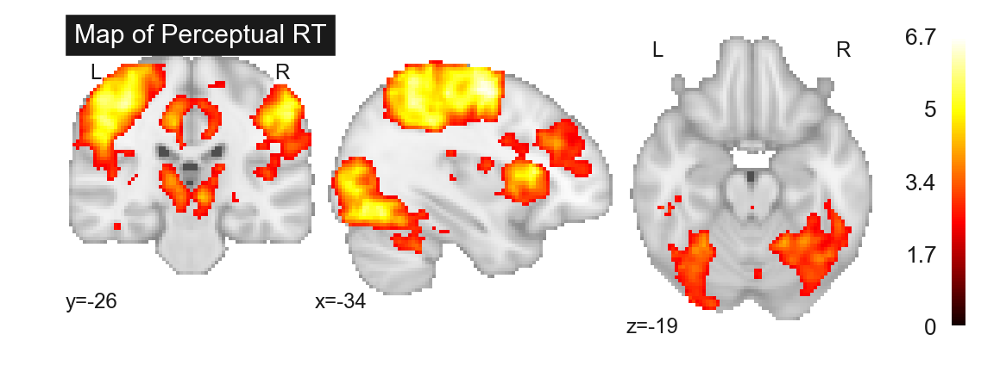

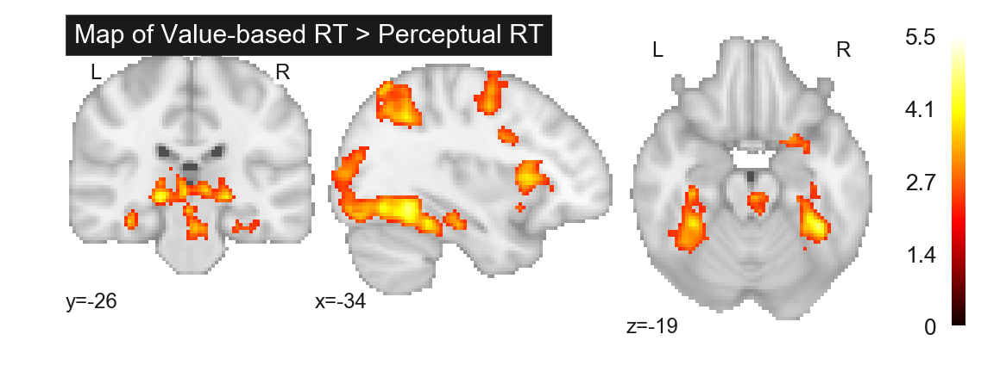

In [33]:
## Map of Value-based RT:
t1rt_map=nilearn.image.load_img(imgpath +'/group/model007/task001/cope014.gfeat/cope1.feat/thresh_zstat1.nii.gz')
nilearn.plotting.plot_stat_map(t1rt_map,cut_coords=[-34,-26,-19],draw_cross=False, 
                               title="Map of Value-based RT")

## Map of Perceptual RT:
t2rt_map=nilearn.image.load_img(imgpath +'/group/model007/task002/cope010.gfeat/cope1.feat/thresh_zstat1.nii.gz')
nilearn.plotting.plot_stat_map(t2rt_map,cut_coords=[-34,-26,-19],draw_cross=False, 
                               title="Map of Perceptual RT")

## Map of (Value-based RT > Perceptual RT: model007 t1c2mint2c2 cope001)
t1vt2rt_map=nilearn.image.load_img(imgpath +'/group/model007/task1_v_task2/t1_rtall_v_t2_rtall.gfeat/cope1.feat/thresh_zstat1.nii.gz')

nilearn.plotting.plot_stat_map(t1vt2rt_map,cut_coords=[-34,-26,-19],draw_cross=False, 
                               title="Map of Value-based RT > Perceptual RT")
plt.show()

### PPI with hippocapus seed for Fast > Slow VB decisions
#### Figure 4

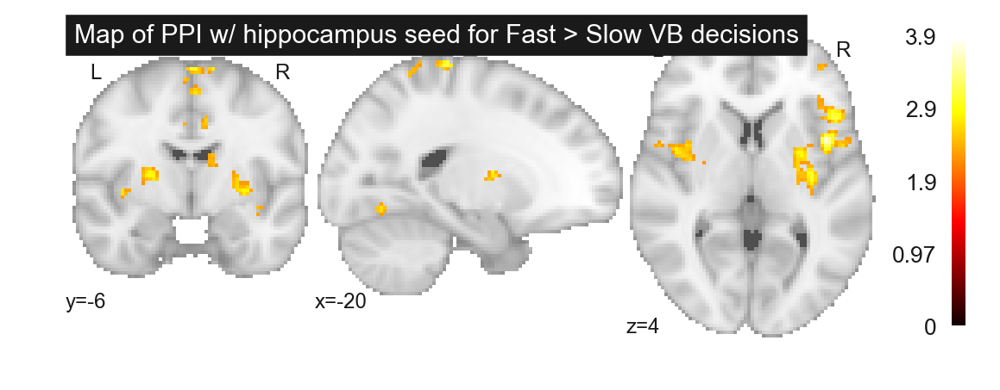

In [34]:
## PPI map with hippocampus seed for Fast > Slow VB decisions:
ppi_map=nilearn.image.load_img(imgpath +'/group/model010/task001/cope011.gfeat/cope1.feat/thresh_zstat1.nii.gz')
nilearn.plotting.plot_stat_map(ppi_map,cut_coords=[-20,-6,4],draw_cross=False, 
                               title="Map of PPI w/ hippocampus seed for Fast > Slow VB decisions")
plt.show()

## Analyses of behavior during memory recognition task

In [35]:
# make list of files
filelist=[]
# use zfill to zero pad subject number, participant IDs are of the form MDMRT_XXX
for s in subjid:
    filelist=filelist+glob.glob(datapath+'MDMRT_'+str(s).zfill(3)+'_memory_run_*m.txt')
# load data into dataframe
memory=pd.read_table(filelist[0],sep=" ")
filelist.remove(filelist[0])
for f in filelist:
    tmp=pd.read_table(f,sep=" ")
    memory=pd.concat([memory,tmp])
    
memory.loc[memory['RT']==999,'RT']=np.nan
memory.loc[(((memory['leftOld']==1) & (memory['Response']=='3#')) | ((memory['leftOld']==0) & (memory['Response']=='4$'))),'respondold']=1
memory.loc[(((memory['leftOld']==0) & (memory['Response']=='3#')) | ((memory['leftOld']==1) & (memory['Response']=='4$'))),'respondold']=0


memory.loc[(((memory['leftOld']==1) & (memory['Response']=='3#')) | ((memory['leftOld']==0) & (memory['Response']=='4$'))),'respondnew']=0
memory.loc[(((memory['leftOld']==0) & (memory['Response']=='3#')) | ((memory['leftOld']==1) & (memory['Response']=='4$'))),'respondnew']=1

memory.to_csv('memory.csv')

In [36]:
gpmem=memory.groupby(['subjid','isold'],as_index=False).mean()
hitratemean=gpmem.loc[gpmem['isold']==1,'respondold'].mean()
hitratesd=gpmem.loc[gpmem['isold']==1,'respondold'].std()

print('The hit rate is ' + str(hitratemean) + ' +/- ' + str(hitratesd))

CRratemean=gpmem.loc[gpmem['isold']==0,'respondnew'].mean()
CRratesd=gpmem.loc[gpmem['isold']==0,'respondnew'].std()

print('The correct rejection rate is ' + str(CRratemean) + ' +/- ' + str(CRratesd))

def dprime(hit,fa):
    d=scipy.stats.norm.ppf(hit)-scipy.stats.norm.ppf(fa)
    return d

d=dprime(gpmem.loc[gpmem['isold']==1,'respondold'],gpmem.loc[gpmem['isold']==0,'respondold'])

print('Mean d` = ' + str(d.mean()) + ' +/- ' + str(d.std()))

gpmem2=memory.groupby(['subjid','isold','respondold'],as_index=False).mean()

hitcr=gpmem2[(((gpmem2['isold']==1) & (gpmem2['respondold']==1)) |((gpmem2['isold']==0) & (gpmem2['respondold']==0)))].groupby('subjid',as_index=False).mean()

print('Mean RT for Hits+CRs = ' + str(hitcr['RT'].mean()) + ' +/- ' + str(hitcr['RT'].std()))

missfa=gpmem2[(((gpmem2['isold']==1) & (gpmem2['respondold']==0)) |((gpmem2['isold']==0) & (gpmem2['respondold']==1)))].groupby('subjid',as_index=False).mean()

print('Mean RT for Misses+FAs = ' + str(missfa['RT'].mean()) + ' +/- ' + str(missfa['RT'].std()))

ttest=scipy.stats.ttest_rel(missfa['RT'],hitcr['RT'])
diff=missfa['RT']-hitcr['RT']
import statsmodels.stats.api as sms
ci=sms.DescrStatsW(diff).tconfint_mean()

print('Repeated measures t-test for RT(Hits+CRs) vs RT(Misses+FAs): difference = ' + str(diff.mean()) + str(ci) + ' t('+str(len(missfa['RT'])-1) + ') = ' +
      str(ttest.statistic) + ', p = ' + str(ttest.pvalue))

memoryold=memory[((memory['isold']==1) & (~np.isnan(memory['RT'])))]

The hit rate is 0.8051177469994079 +/- 0.15325170683831277
The correct rejection rate is 0.7620586975849762 +/- 0.15172634441322166
Mean d` = 1.7834361231 +/- 0.56644874874
Mean RT for Hits+CRs = 1.24294225695808 +/- 0.1741461201512979
Mean RT for Misses+FAs = 1.425226761070711 +/- 0.24268788542559977
Repeated measures t-test for RT(Hits+CRs) vs RT(Misses+FAs): difference = 0.18228450411263067(0.12957826210705481, 0.23499074611820653) t(29) = 7.07342540326, p = 8.81049081069e-08


### Mixed effects logistic regression of liking rating on choseold

In [37]:
%%R -i memoryold

memorychoicemod=glmer(respondold ~ Rating + (Rating|subjid), data=memoryold, family='binomial')

nranpars <- length(getME(memorychoicemod,"theta"))
nfixpars <- length(fixef(memorychoicemod))
confintmemorychoicemod=confint(memorychoicemod,method="boot", nsim=1000, parm=(nranpars+1):(nranpars+nfixpars), parallel="multicore", ncpus=8)

save(memorychoicemod,confintmemorychoicemod, file = "memorychoicemod.RData")
load("memorychoicemod.RData")

print(summary(memorychoicemod))
print("BOOTSTRAPPED CIs")
print(confintmemorychoicemod)


/Users/akram/anaconda3/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:191: FutureWarning: from_items is deprecated. Please use DataFrame.from_dict(dict(items), ...) instead. DataFrame.from_dict(OrderedDict(items)) may be used to preserve the key order.
  res = PandasDataFrame.from_items(items)


Generalized linear mixed model fit by maximum likelihood (Laplace
  Approximation) [glmerMod]
 Family: binomial  ( logit )
Formula: respondold ~ Rating + (Rating | subjid)
   Data: memoryold

     AIC      BIC   logLik deviance df.resid 
  2623.8   2653.8  -1306.9   2613.8     2966 

Scaled residuals: 
    Min      1Q  Median      3Q     Max 
-5.0606  0.1947  0.3717  0.4812  2.0084 

Random effects:
 Groups Name        Variance Std.Dev. Corr 
 subjid (Intercept) 1.56779  1.2521        
        Rating      0.01952  0.1397   -0.72
Number of obs: 2971, groups:  subjid, 30

Fixed effects:
            Estimate Std. Error z value Pr(>|z|)    
(Intercept)  1.33034    0.26796   4.965 6.88e-07 ***
Rating       0.08067    0.03635   2.219   0.0265 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Correlation of Fixed Effects:
       (Intr)
Rating -0.759
[1] "BOOTSTRAPPED CIs"
                 2.5 %    97.5 %
(Intercept) 0.77779425 1.8628172
Rating      0.01000448 0.1544716


### Mixed effects linear regression of liking rating on RT 

In [38]:
memorymd = smf.mixedlm('RT ~ Rating', memoryold, groups=memoryold['subjid'])
memorymdf = memorymd.fit()
print(memorymdf.summary())

         Mixed Linear Model Regression Results
Model:            MixedLM Dependent Variable: RT        
No. Observations: 2971    Method:             REML      
No. Groups:       30      Scale:              0.1505    
Min. group size:  92      Likelihood:         -1451.1064
Max. group size:  100     Converged:          Yes       
Mean group size:  99.0                                  
--------------------------------------------------------
              Coef.  Std.Err.   z    P>|z| [0.025 0.975]
--------------------------------------------------------
Intercept      1.236    0.032 38.093 0.000  1.173  1.300
Rating        -0.006    0.003 -2.004 0.045 -0.011 -0.000
Group Var      0.024    0.017                           

